In [1]:
import torchvision.models as models
import torch.onnx as onnx
import torch

/opt/conda/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import matplotlib.pyplot as plt
from imutils import paths
import numpy as np
import random
import time
import PIL
import cv2
import os

In [3]:
from models.experimental import attempt_load
from utils.datasets import letterbox
from utils.general import check_img_size, non_max_suppression_face, apply_classifier, scale_coords, xywh2xyxy, xyxy2xywh, \
    strip_optimizer, set_logging, increment_path
from utils.plots import plot_one_box
from utils.torch_utils import select_device, load_classifier, time_synchronized

In [4]:
def make_dir(dirName):
    # Create a target directory & all intermediate 
    # directories if they don't exists
    
    if not os.path.exists(dirName):
        os.makedirs(dirName, exist_ok = True)
        print("[INFO] Directory " ,dirName,  " created")
    else:
        print("[INFO] Directory " ,dirName,  " already exists") 

In [5]:
exp_id = 999            # experiment ID
iou_thr = 0.5           # IoU threshold
con_thr = 0.02          # confidence threshold
img_size = 640          # image size used at evaluation

weights = "/workspace/yolov5-face-my/runs/train/exp1_l6/weights/best.pt"    # path to the model weights

# dataset directories
anime_dir = '/workspace/dataset/animefaces/'
art_dir = '/workspace/dataset/artisticfaces/'
birds_dir = '/workspace/dataset/birds/'
met_dir = '/workspace/dataset/metfaces/'
pets_dir = '/workspace/dataset/pets/'
turtles_dir = '/workspace/dataset/turtles/'

# Get paths to the dataset images
anime_paths = list(paths.list_images(os.path.join(anime_dir, 'images')))
art_paths = list(paths.list_images(os.path.join(art_dir, 'images')))
birds_paths = list(paths.list_images(os.path.join(birds_dir, 'images')))
met_paths = list(paths.list_images(os.path.join(met_dir, 'images')))
pets_paths = list(paths.list_images(os.path.join(pets_dir, 'images')))
turtles_paths = list(paths.list_images(os.path.join(turtles_dir, 'images')))

print("Anime Faces set size: {}". format(len(anime_paths)))
print("Artistic Faces set size: {}". format(len(art_paths)))
print("Birds Faces set size: {}". format(len(birds_paths)))
print("Met Faces set size: {}". format(len(met_paths)))
print("Pet Faces set size: {}". format(len(pets_paths)))
print("Turtle Faces set size: {}". format(len(turtles_paths)))

Anime Faces set size: 6641
Artistic Faces set size: 160
Birds Faces set size: 11788
Met Faces set size: 1284
Pet Faces set size: 3686
Turtle Faces set size: 2000


In [6]:
# Create directories for saving evaluation results
birds_res_path = "Object-Detection-Metrics/results/external/exp_{}/birds/detections_{}_{}".format(exp_id, 
                                                                                         int(iou_thr * 100),
                                                                                         int(con_thr * 100))
art_res_path = "Object-Detection-Metrics/results/external/exp_{}/artisticfaces/detections_{}_{}".format(exp_id, 
                                                                                         int(iou_thr * 100),
                                                                                         int(con_thr * 100))
turtles_res_path = "Object-Detection-Metrics/results/external/exp_{}/turtles/detections_{}_{}".format(exp_id, 
                                                                                         int(iou_thr * 100),
                                                                                         int(con_thr * 100))
anime_res_path = "Object-Detection-Metrics/results/external/exp_{}/animefaces/detections_{}_{}".format(exp_id, 
                                                                                       int(iou_thr * 100),
                                                                                       int(con_thr * 100))
pets_res_path = "Object-Detection-Metrics/results/external/exp_{}/pets/detections_{}_{}".format(exp_id, 
                                                                                         int(iou_thr * 100),
                                                                                         int(con_thr * 100))
met_res_path = "Object-Detection-Metrics/results/external/exp_{}/metfaces/detections_{}_{}".format(exp_id, 
                                                                                       int(iou_thr * 100),
                                                                                       int(con_thr * 100))

make_dir(birds_res_path)
make_dir(art_res_path)
make_dir(turtles_res_path)
make_dir(anime_res_path)
make_dir(pets_res_path)
make_dir(met_res_path)

[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/birds/detections_50_2  created
[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/artisticfaces/detections_50_2  created
[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/turtles/detections_50_2  created
[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/animefaces/detections_50_2  created
[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/pets/detections_50_2  created
[INFO] Directory  Object-Detection-Metrics/results/external/exp_999/metfaces/detections_50_2  created


In [7]:
# Load weights
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = attempt_load(weights, map_location=device)
device, weights

Fusing layers... 


(device(type='cuda', index=0),
 '/workspace/yolov5-face-my/runs/train/exp1_l6/weights/best.pt')

In [8]:
def scale_coords_landmarks(img1_shape, coords, img0_shape, ratio_pad=None):
    # Rescale coords (xyxy) from img1_shape to img0_shape
    
    if ratio_pad is None:  # calculate from img0_shape
        gain = min(img1_shape[0] / img0_shape[0], img1_shape[1] / img0_shape[1])  # gain  = old / new
        pad = (img1_shape[1] - img0_shape[1] * gain) / 2, (img1_shape[0] - img0_shape[0] * gain) / 2  # wh padding
    else:
        gain = ratio_pad[0][0]
        pad = ratio_pad[1]

    coords[:, [0, 2, 4, 6, 8]] -= pad[0]  # x padding
    coords[:, [1, 3, 5, 7, 9]] -= pad[1]  # y padding
    coords[:, :10] /= gain
    coords[:, 0].clamp_(0, img0_shape[1])  # x1
    coords[:, 1].clamp_(0, img0_shape[0])  # y1
    coords[:, 2].clamp_(0, img0_shape[1])  # x2
    coords[:, 3].clamp_(0, img0_shape[0])  # y2
    coords[:, 4].clamp_(0, img0_shape[1])  # x3
    coords[:, 5].clamp_(0, img0_shape[0])  # y3
    coords[:, 6].clamp_(0, img0_shape[1])  # x4
    coords[:, 7].clamp_(0, img0_shape[0])  # y4
    coords[:, 8].clamp_(0, img0_shape[1])  # x5
    coords[:, 9].clamp_(0, img0_shape[0])  # y5
    
    return coords

In [9]:
def show_results(img, xywh, conf, landmarks):
    # Draw detected bounding box with landmarks
    
    h,w,c = img.shape
    
    tl = 1 or round(0.002 * (h + w) / 2) + 1    # line/font thickness
    clors = [(255,0,0),(0,255,0),(0,0,255),(255,255,0),(0,255,255)]    # colors for landmarks

    # Convert YOLO coordinates to x1, y1, x2, y2 format
    x1 = int(xywh[0] * w - 0.5 * xywh[2] * w)
    y1 = int(xywh[1] * h - 0.5 * xywh[3] * h)
    x2 = int(xywh[0] * w + 0.5 * xywh[2] * w)
    y2 = int(xywh[1] * h + 0.5 * xywh[3] * h)
    
    # Draw bounding box
    cv2.rectangle(img, (x1,y1), (x2, y2), (0,255,0), thickness=tl, lineType=cv2.LINE_AA)

    # Draw facial landmarks
    for i in range(5):
        point_x = int(landmarks[2 * i] * w)
        point_y = int(landmarks[2 * i + 1] * h)
        cv2.circle(img, (point_x, point_y), tl+1, clors[i], -1)

    # Put confidence threshold
    tf = max(tl - 1, 1)  # font thickness
    label = str(conf)[:5]
    cv2.putText(img, label, (x1, y1 - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    
    return img

In [11]:
def detect_one(model, image_path, device, imgsz=640, conf_thres=0.5, iou_thres=0.5, augment=None, show=False):
    # Detect face region and facial landmarks on given images
    
    # Load image and create a copy
    orgimg = cv2.imread(image_path)
    img0 = orgimg.copy()
    
    # Preprocess the image     
    stride = int(model.stride.max())    
    if imgsz <= 0:                    
        imgsz = dynamic_resize(img0.shape)
    imgsz = check_img_size(imgsz, s=64)
    img = letterbox(img0, imgsz)[0]
    img = img[:, :, ::-1].transpose(2, 0, 1)
    img = np.ascontiguousarray(img)
    img = torch.from_numpy(img).to(device)
    img = img.float()
    img /= 255.0
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    if augment is not None:
        pred = model(img, augment=True, aug_setting=augment)[0]
    else:
        pred = model(img, augment=False)[0]
    
    # Apply non max suppression
    pred = non_max_suppression_face(pred, conf_thres, iou_thres)[0]
    gn = torch.tensor(img0.shape)[[1, 0, 1, 0]].to(device)                        # normalization gain whwh
    gn_lks = torch.tensor(img0.shape)[[1, 0, 1, 0, 1, 0, 1, 0, 1, 0]].to(device)  # normalization gain landmarks
    
    # Scale and store predictions
    boxes = []
    landmarks = []
    conf_scores = []
    h, w, c = img0.shape
    if pred is not None:
        pred[:, :4] = scale_coords(img.shape[2:], pred[:, :4], img0.shape).round()
        pred[:, 5:15] = scale_coords_landmarks(img.shape[2:], pred[:, 5:15], img0.shape).round()
        for j in range(pred.size()[0]):
            xywh = (xyxy2xywh(pred[j, :4].view(1, 4)) / gn).view(-1)
            xywh = xywh.data.cpu().numpy()
            conf = pred[j, 4].cpu().numpy()
            points = (pred[j, 5:15].view(1, 10) / gn_lks).view(-1).tolist()
            class_num = pred[j, 15].cpu().numpy()
            x1 = int(xywh[0] * w - 0.5 * xywh[2] * w)
            y1 = int(xywh[1] * h - 0.5 * xywh[3] * h)
            x2 = int(xywh[0] * w + 0.5 * xywh[2] * w)
            y2 = int(xywh[1] * h + 0.5 * xywh[3] * h)
                
            boxes.append([x1, y1, x2-x1, y2-y1])
            landmarks.append(points)
            conf_scores.append(conf)
            
            if show:
                orgimg = show_results(orgimg, xywh, conf, points)
            
    if show:
        img = PIL.Image.fromarray(cv2.cvtColor(orgimg, cv2.COLOR_BGR2RGB))
        img.show()
        
    return boxes, landmarks, conf_scores

In [12]:
def evaluate(imagePaths, res_path, model, device, img_size, con_thr, iou_thr, augment=None):
    # Evaluate model performance on a dataset
    
    for ind, imagePath in enumerate(imagePaths, 1):
        print("Processing image: {}/{}".format(ind, len(imagePaths)))
        
        # Detect for all of the image sizes
        boxes, landmarks, scores = detect_one(model, imagePath, device, img_size, 
                                                                 con_thr, iou_thr, augment=augment)
        
        # Open the file to  write the results in absolute Object-Detection-Metrics format
        # "face [conf_score] [x1] [x2] [w] [h]"        
        imageName = imagePath.split('/')[-1].split('.')[0]
        det_file = open("{}/{}.txt".format(res_path, imageName), "w")
    
        # Iterate through the detected bounding boxes and conf scores
        # and write to the txt file
        for pred_box, conf_score in zip(boxes, scores):
            det_file.write('face')
            det_file.write(" ")
            det_file.write(str(conf_score))
            det_file.write(" ")
            det_file.write(str(pred_box[0]))
            det_file.write(" ")
            det_file.write(str(pred_box[1]))
            det_file.write(" ")
            det_file.write(str(pred_box[2]))
            det_file.write(" ")
            det_file.write(str(pred_box[3]))
            det_file.write("\n")
                
        det_file.close()

In [13]:
evaluate(art_paths, art_res_path, model, device, img_size, con_thr, iou_thr, augment=2)

Processing image: 1/160
Processing image: 2/160
Processing image: 3/160
Processing image: 4/160
Processing image: 5/160
Processing image: 6/160
Processing image: 7/160
Processing image: 8/160
Processing image: 9/160
Processing image: 10/160
Processing image: 11/160
Processing image: 12/160
Processing image: 13/160
Processing image: 14/160
Processing image: 15/160
Processing image: 16/160
Processing image: 17/160
Processing image: 18/160
Processing image: 19/160
Processing image: 20/160


KeyboardInterrupt: 

In [16]:
evaluate(birds_paths, birds_res_path, model, device, img_size, con_thr, iou_thr)

Processing image: 1/11788
Processing image: 2/11788
Processing image: 3/11788
Processing image: 4/11788
Processing image: 5/11788
Processing image: 6/11788
Processing image: 7/11788
Processing image: 8/11788
Processing image: 9/11788
Processing image: 10/11788
Processing image: 11/11788
Processing image: 12/11788
Processing image: 13/11788
Processing image: 14/11788
Processing image: 15/11788
Processing image: 16/11788
Processing image: 17/11788
Processing image: 18/11788
Processing image: 19/11788
Processing image: 20/11788
Processing image: 21/11788
Processing image: 22/11788
Processing image: 23/11788
Processing image: 24/11788
Processing image: 25/11788
Processing image: 26/11788
Processing image: 27/11788
Processing image: 28/11788
Processing image: 29/11788
Processing image: 30/11788
Processing image: 31/11788
Processing image: 32/11788
Processing image: 33/11788
Processing image: 34/11788
Processing image: 35/11788
Processing image: 36/11788
Processing image: 37/11788
Processing

Processing image: 298/11788
Processing image: 299/11788
Processing image: 300/11788
Processing image: 301/11788
Processing image: 302/11788
Processing image: 303/11788
Processing image: 304/11788
Processing image: 305/11788
Processing image: 306/11788
Processing image: 307/11788
Processing image: 308/11788
Processing image: 309/11788
Processing image: 310/11788
Processing image: 311/11788
Processing image: 312/11788
Processing image: 313/11788
Processing image: 314/11788
Processing image: 315/11788
Processing image: 316/11788
Processing image: 317/11788
Processing image: 318/11788
Processing image: 319/11788
Processing image: 320/11788
Processing image: 321/11788
Processing image: 322/11788
Processing image: 323/11788
Processing image: 324/11788
Processing image: 325/11788
Processing image: 326/11788
Processing image: 327/11788
Processing image: 328/11788
Processing image: 329/11788
Processing image: 330/11788
Processing image: 331/11788
Processing image: 332/11788
Processing image: 33

Processing image: 591/11788
Processing image: 592/11788
Processing image: 593/11788
Processing image: 594/11788
Processing image: 595/11788
Processing image: 596/11788
Processing image: 597/11788
Processing image: 598/11788
Processing image: 599/11788
Processing image: 600/11788
Processing image: 601/11788
Processing image: 602/11788
Processing image: 603/11788
Processing image: 604/11788
Processing image: 605/11788
Processing image: 606/11788
Processing image: 607/11788
Processing image: 608/11788
Processing image: 609/11788
Processing image: 610/11788
Processing image: 611/11788
Processing image: 612/11788
Processing image: 613/11788
Processing image: 614/11788
Processing image: 615/11788
Processing image: 616/11788
Processing image: 617/11788
Processing image: 618/11788
Processing image: 619/11788
Processing image: 620/11788
Processing image: 621/11788
Processing image: 622/11788
Processing image: 623/11788
Processing image: 624/11788
Processing image: 625/11788
Processing image: 62

Processing image: 885/11788
Processing image: 886/11788
Processing image: 887/11788
Processing image: 888/11788
Processing image: 889/11788
Processing image: 890/11788
Processing image: 891/11788
Processing image: 892/11788
Processing image: 893/11788
Processing image: 894/11788
Processing image: 895/11788
Processing image: 896/11788
Processing image: 897/11788
Processing image: 898/11788
Processing image: 899/11788
Processing image: 900/11788
Processing image: 901/11788
Processing image: 902/11788
Processing image: 903/11788
Processing image: 904/11788
Processing image: 905/11788
Processing image: 906/11788
Processing image: 907/11788
Processing image: 908/11788
Processing image: 909/11788
Processing image: 910/11788
Processing image: 911/11788
Processing image: 912/11788
Processing image: 913/11788
Processing image: 914/11788
Processing image: 915/11788
Processing image: 916/11788
Processing image: 917/11788
Processing image: 918/11788
Processing image: 919/11788
Processing image: 92

Processing image: 1173/11788
Processing image: 1174/11788
Processing image: 1175/11788
Processing image: 1176/11788
Processing image: 1177/11788
Processing image: 1178/11788
Processing image: 1179/11788
Processing image: 1180/11788
Processing image: 1181/11788
Processing image: 1182/11788
Processing image: 1183/11788
Processing image: 1184/11788
Processing image: 1185/11788
Processing image: 1186/11788
Processing image: 1187/11788
Processing image: 1188/11788
Processing image: 1189/11788
Processing image: 1190/11788
Processing image: 1191/11788
Processing image: 1192/11788
Processing image: 1193/11788
Processing image: 1194/11788
Processing image: 1195/11788
Processing image: 1196/11788
Processing image: 1197/11788
Processing image: 1198/11788
Processing image: 1199/11788
Processing image: 1200/11788
Processing image: 1201/11788
Processing image: 1202/11788
Processing image: 1203/11788
Processing image: 1204/11788
Processing image: 1205/11788
Processing image: 1206/11788
Processing ima

Processing image: 1458/11788
Processing image: 1459/11788
Processing image: 1460/11788
Processing image: 1461/11788
Processing image: 1462/11788
Processing image: 1463/11788
Processing image: 1464/11788
Processing image: 1465/11788
Processing image: 1466/11788
Processing image: 1467/11788
Processing image: 1468/11788
Processing image: 1469/11788
Processing image: 1470/11788
Processing image: 1471/11788
Processing image: 1472/11788
Processing image: 1473/11788
Processing image: 1474/11788
Processing image: 1475/11788
Processing image: 1476/11788
Processing image: 1477/11788
Processing image: 1478/11788
Processing image: 1479/11788
Processing image: 1480/11788
Processing image: 1481/11788
Processing image: 1482/11788
Processing image: 1483/11788
Processing image: 1484/11788
Processing image: 1485/11788
Processing image: 1486/11788
Processing image: 1487/11788
Processing image: 1488/11788
Processing image: 1489/11788
Processing image: 1490/11788
Processing image: 1491/11788
Processing ima

Processing image: 1743/11788
Processing image: 1744/11788
Processing image: 1745/11788
Processing image: 1746/11788
Processing image: 1747/11788
Processing image: 1748/11788
Processing image: 1749/11788
Processing image: 1750/11788
Processing image: 1751/11788
Processing image: 1752/11788
Processing image: 1753/11788
Processing image: 1754/11788
Processing image: 1755/11788
Processing image: 1756/11788
Processing image: 1757/11788
Processing image: 1758/11788
Processing image: 1759/11788
Processing image: 1760/11788
Processing image: 1761/11788
Processing image: 1762/11788
Processing image: 1763/11788
Processing image: 1764/11788
Processing image: 1765/11788
Processing image: 1766/11788
Processing image: 1767/11788
Processing image: 1768/11788
Processing image: 1769/11788
Processing image: 1770/11788
Processing image: 1771/11788
Processing image: 1772/11788
Processing image: 1773/11788
Processing image: 1774/11788
Processing image: 1775/11788
Processing image: 1776/11788
Processing ima

Processing image: 2028/11788
Processing image: 2029/11788
Processing image: 2030/11788
Processing image: 2031/11788
Processing image: 2032/11788
Processing image: 2033/11788
Processing image: 2034/11788
Processing image: 2035/11788
Processing image: 2036/11788
Processing image: 2037/11788
Processing image: 2038/11788
Processing image: 2039/11788
Processing image: 2040/11788
Processing image: 2041/11788
Processing image: 2042/11788
Processing image: 2043/11788
Processing image: 2044/11788
Processing image: 2045/11788
Processing image: 2046/11788
Processing image: 2047/11788
Processing image: 2048/11788
Processing image: 2049/11788
Processing image: 2050/11788
Processing image: 2051/11788
Processing image: 2052/11788
Processing image: 2053/11788
Processing image: 2054/11788
Processing image: 2055/11788
Processing image: 2056/11788
Processing image: 2057/11788
Processing image: 2058/11788
Processing image: 2059/11788
Processing image: 2060/11788
Processing image: 2061/11788
Processing ima

Processing image: 2313/11788
Processing image: 2314/11788
Processing image: 2315/11788
Processing image: 2316/11788
Processing image: 2317/11788
Processing image: 2318/11788
Processing image: 2319/11788
Processing image: 2320/11788
Processing image: 2321/11788
Processing image: 2322/11788
Processing image: 2323/11788
Processing image: 2324/11788
Processing image: 2325/11788
Processing image: 2326/11788
Processing image: 2327/11788
Processing image: 2328/11788
Processing image: 2329/11788
Processing image: 2330/11788
Processing image: 2331/11788
Processing image: 2332/11788
Processing image: 2333/11788
Processing image: 2334/11788
Processing image: 2335/11788
Processing image: 2336/11788
Processing image: 2337/11788
Processing image: 2338/11788
Processing image: 2339/11788
Processing image: 2340/11788
Processing image: 2341/11788
Processing image: 2342/11788
Processing image: 2343/11788
Processing image: 2344/11788
Processing image: 2345/11788
Processing image: 2346/11788
Processing ima

Processing image: 2598/11788
Processing image: 2599/11788
Processing image: 2600/11788
Processing image: 2601/11788
Processing image: 2602/11788
Processing image: 2603/11788
Processing image: 2604/11788
Processing image: 2605/11788
Processing image: 2606/11788
Processing image: 2607/11788
Processing image: 2608/11788
Processing image: 2609/11788
Processing image: 2610/11788
Processing image: 2611/11788
Processing image: 2612/11788
Processing image: 2613/11788
Processing image: 2614/11788
Processing image: 2615/11788
Processing image: 2616/11788
Processing image: 2617/11788
Processing image: 2618/11788
Processing image: 2619/11788
Processing image: 2620/11788
Processing image: 2621/11788
Processing image: 2622/11788
Processing image: 2623/11788
Processing image: 2624/11788
Processing image: 2625/11788
Processing image: 2626/11788
Processing image: 2627/11788
Processing image: 2628/11788
Processing image: 2629/11788
Processing image: 2630/11788
Processing image: 2631/11788
Processing ima

Processing image: 2883/11788
Processing image: 2884/11788
Processing image: 2885/11788
Processing image: 2886/11788
Processing image: 2887/11788
Processing image: 2888/11788
Processing image: 2889/11788
Processing image: 2890/11788
Processing image: 2891/11788
Processing image: 2892/11788
Processing image: 2893/11788
Processing image: 2894/11788
Processing image: 2895/11788
Processing image: 2896/11788
Processing image: 2897/11788
Processing image: 2898/11788
Processing image: 2899/11788
Processing image: 2900/11788
Processing image: 2901/11788
Processing image: 2902/11788
Processing image: 2903/11788
Processing image: 2904/11788
Processing image: 2905/11788
Processing image: 2906/11788
Processing image: 2907/11788
Processing image: 2908/11788
Processing image: 2909/11788
Processing image: 2910/11788
Processing image: 2911/11788
Processing image: 2912/11788
Processing image: 2913/11788
Processing image: 2914/11788
Processing image: 2915/11788
Processing image: 2916/11788
Processing ima

Processing image: 3168/11788
Processing image: 3169/11788
Processing image: 3170/11788
Processing image: 3171/11788
Processing image: 3172/11788
Processing image: 3173/11788
Processing image: 3174/11788
Processing image: 3175/11788
Processing image: 3176/11788
Processing image: 3177/11788
Processing image: 3178/11788
Processing image: 3179/11788
Processing image: 3180/11788
Processing image: 3181/11788
Processing image: 3182/11788
Processing image: 3183/11788
Processing image: 3184/11788
Processing image: 3185/11788
Processing image: 3186/11788
Processing image: 3187/11788
Processing image: 3188/11788
Processing image: 3189/11788
Processing image: 3190/11788
Processing image: 3191/11788
Processing image: 3192/11788
Processing image: 3193/11788
Processing image: 3194/11788
Processing image: 3195/11788
Processing image: 3196/11788
Processing image: 3197/11788
Processing image: 3198/11788
Processing image: 3199/11788
Processing image: 3200/11788
Processing image: 3201/11788
Processing ima

Processing image: 3453/11788
Processing image: 3454/11788
Processing image: 3455/11788
Processing image: 3456/11788
Processing image: 3457/11788
Processing image: 3458/11788
Processing image: 3459/11788
Processing image: 3460/11788
Processing image: 3461/11788
Processing image: 3462/11788
Processing image: 3463/11788
Processing image: 3464/11788
Processing image: 3465/11788
Processing image: 3466/11788
Processing image: 3467/11788
Processing image: 3468/11788
Processing image: 3469/11788
Processing image: 3470/11788
Processing image: 3471/11788
Processing image: 3472/11788
Processing image: 3473/11788
Processing image: 3474/11788
Processing image: 3475/11788
Processing image: 3476/11788
Processing image: 3477/11788
Processing image: 3478/11788
Processing image: 3479/11788
Processing image: 3480/11788
Processing image: 3481/11788
Processing image: 3482/11788
Processing image: 3483/11788
Processing image: 3484/11788
Processing image: 3485/11788
Processing image: 3486/11788
Processing ima

Processing image: 3738/11788
Processing image: 3739/11788
Processing image: 3740/11788
Processing image: 3741/11788
Processing image: 3742/11788
Processing image: 3743/11788
Processing image: 3744/11788
Processing image: 3745/11788
Processing image: 3746/11788
Processing image: 3747/11788
Processing image: 3748/11788
Processing image: 3749/11788
Processing image: 3750/11788
Processing image: 3751/11788
Processing image: 3752/11788
Processing image: 3753/11788
Processing image: 3754/11788
Processing image: 3755/11788
Processing image: 3756/11788
Processing image: 3757/11788
Processing image: 3758/11788
Processing image: 3759/11788
Processing image: 3760/11788
Processing image: 3761/11788
Processing image: 3762/11788
Processing image: 3763/11788
Processing image: 3764/11788
Processing image: 3765/11788
Processing image: 3766/11788
Processing image: 3767/11788
Processing image: 3768/11788
Processing image: 3769/11788
Processing image: 3770/11788
Processing image: 3771/11788
Processing ima

Processing image: 4023/11788
Processing image: 4024/11788
Processing image: 4025/11788
Processing image: 4026/11788
Processing image: 4027/11788
Processing image: 4028/11788
Processing image: 4029/11788
Processing image: 4030/11788
Processing image: 4031/11788
Processing image: 4032/11788
Processing image: 4033/11788
Processing image: 4034/11788
Processing image: 4035/11788
Processing image: 4036/11788
Processing image: 4037/11788
Processing image: 4038/11788
Processing image: 4039/11788
Processing image: 4040/11788
Processing image: 4041/11788
Processing image: 4042/11788
Processing image: 4043/11788
Processing image: 4044/11788
Processing image: 4045/11788
Processing image: 4046/11788
Processing image: 4047/11788
Processing image: 4048/11788
Processing image: 4049/11788
Processing image: 4050/11788
Processing image: 4051/11788
Processing image: 4052/11788
Processing image: 4053/11788
Processing image: 4054/11788
Processing image: 4055/11788
Processing image: 4056/11788
Processing ima

Processing image: 4308/11788
Processing image: 4309/11788
Processing image: 4310/11788
Processing image: 4311/11788
Processing image: 4312/11788
Processing image: 4313/11788
Processing image: 4314/11788
Processing image: 4315/11788
Processing image: 4316/11788
Processing image: 4317/11788
Processing image: 4318/11788
Processing image: 4319/11788
Processing image: 4320/11788
Processing image: 4321/11788
Processing image: 4322/11788
Processing image: 4323/11788
Processing image: 4324/11788
Processing image: 4325/11788
Processing image: 4326/11788
Processing image: 4327/11788
Processing image: 4328/11788
Processing image: 4329/11788
Processing image: 4330/11788
Processing image: 4331/11788
Processing image: 4332/11788
Processing image: 4333/11788
Processing image: 4334/11788
Processing image: 4335/11788
Processing image: 4336/11788
Processing image: 4337/11788
Processing image: 4338/11788
Processing image: 4339/11788
Processing image: 4340/11788
Processing image: 4341/11788
Processing ima

Processing image: 4593/11788
Processing image: 4594/11788
Processing image: 4595/11788
Processing image: 4596/11788
Processing image: 4597/11788
Processing image: 4598/11788
Processing image: 4599/11788
Processing image: 4600/11788
Processing image: 4601/11788
Processing image: 4602/11788
Processing image: 4603/11788
Processing image: 4604/11788
Processing image: 4605/11788
Processing image: 4606/11788
Processing image: 4607/11788
Processing image: 4608/11788
Processing image: 4609/11788
Processing image: 4610/11788
Processing image: 4611/11788
Processing image: 4612/11788
Processing image: 4613/11788
Processing image: 4614/11788
Processing image: 4615/11788
Processing image: 4616/11788
Processing image: 4617/11788
Processing image: 4618/11788
Processing image: 4619/11788
Processing image: 4620/11788
Processing image: 4621/11788
Processing image: 4622/11788
Processing image: 4623/11788
Processing image: 4624/11788
Processing image: 4625/11788
Processing image: 4626/11788
Processing ima

Processing image: 4878/11788
Processing image: 4879/11788
Processing image: 4880/11788
Processing image: 4881/11788
Processing image: 4882/11788
Processing image: 4883/11788
Processing image: 4884/11788
Processing image: 4885/11788
Processing image: 4886/11788
Processing image: 4887/11788
Processing image: 4888/11788
Processing image: 4889/11788
Processing image: 4890/11788
Processing image: 4891/11788
Processing image: 4892/11788
Processing image: 4893/11788
Processing image: 4894/11788
Processing image: 4895/11788
Processing image: 4896/11788
Processing image: 4897/11788
Processing image: 4898/11788
Processing image: 4899/11788
Processing image: 4900/11788
Processing image: 4901/11788
Processing image: 4902/11788
Processing image: 4903/11788
Processing image: 4904/11788
Processing image: 4905/11788
Processing image: 4906/11788
Processing image: 4907/11788
Processing image: 4908/11788
Processing image: 4909/11788
Processing image: 4910/11788
Processing image: 4911/11788
Processing ima

Processing image: 5162/11788
Processing image: 5163/11788
Processing image: 5164/11788
Processing image: 5165/11788
Processing image: 5166/11788
Processing image: 5167/11788
Processing image: 5168/11788
Processing image: 5169/11788
Processing image: 5170/11788
Processing image: 5171/11788
Processing image: 5172/11788
Processing image: 5173/11788
Processing image: 5174/11788
Processing image: 5175/11788
Processing image: 5176/11788
Processing image: 5177/11788
Processing image: 5178/11788
Processing image: 5179/11788
Processing image: 5180/11788
Processing image: 5181/11788
Processing image: 5182/11788
Processing image: 5183/11788
Processing image: 5184/11788
Processing image: 5185/11788
Processing image: 5186/11788
Processing image: 5187/11788
Processing image: 5188/11788
Processing image: 5189/11788
Processing image: 5190/11788
Processing image: 5191/11788
Processing image: 5192/11788
Processing image: 5193/11788
Processing image: 5194/11788
Processing image: 5195/11788
Processing ima

Processing image: 5447/11788
Processing image: 5448/11788
Processing image: 5449/11788
Processing image: 5450/11788
Processing image: 5451/11788
Processing image: 5452/11788
Processing image: 5453/11788
Processing image: 5454/11788
Processing image: 5455/11788
Processing image: 5456/11788
Processing image: 5457/11788
Processing image: 5458/11788
Processing image: 5459/11788
Processing image: 5460/11788
Processing image: 5461/11788
Processing image: 5462/11788
Processing image: 5463/11788
Processing image: 5464/11788
Processing image: 5465/11788
Processing image: 5466/11788
Processing image: 5467/11788
Processing image: 5468/11788
Processing image: 5469/11788
Processing image: 5470/11788
Processing image: 5471/11788
Processing image: 5472/11788
Processing image: 5473/11788
Processing image: 5474/11788
Processing image: 5475/11788
Processing image: 5476/11788
Processing image: 5477/11788
Processing image: 5478/11788
Processing image: 5479/11788
Processing image: 5480/11788
Processing ima

Processing image: 5732/11788
Processing image: 5733/11788
Processing image: 5734/11788
Processing image: 5735/11788
Processing image: 5736/11788
Processing image: 5737/11788
Processing image: 5738/11788
Processing image: 5739/11788
Processing image: 5740/11788
Processing image: 5741/11788
Processing image: 5742/11788
Processing image: 5743/11788
Processing image: 5744/11788
Processing image: 5745/11788
Processing image: 5746/11788
Processing image: 5747/11788
Processing image: 5748/11788
Processing image: 5749/11788
Processing image: 5750/11788
Processing image: 5751/11788
Processing image: 5752/11788
Processing image: 5753/11788
Processing image: 5754/11788
Processing image: 5755/11788
Processing image: 5756/11788
Processing image: 5757/11788
Processing image: 5758/11788
Processing image: 5759/11788
Processing image: 5760/11788
Processing image: 5761/11788
Processing image: 5762/11788
Processing image: 5763/11788
Processing image: 5764/11788
Processing image: 5765/11788
Processing ima

Processing image: 6017/11788
Processing image: 6018/11788
Processing image: 6019/11788
Processing image: 6020/11788
Processing image: 6021/11788
Processing image: 6022/11788
Processing image: 6023/11788
Processing image: 6024/11788
Processing image: 6025/11788
Processing image: 6026/11788
Processing image: 6027/11788
Processing image: 6028/11788
Processing image: 6029/11788
Processing image: 6030/11788
Processing image: 6031/11788
Processing image: 6032/11788
Processing image: 6033/11788
Processing image: 6034/11788
Processing image: 6035/11788
Processing image: 6036/11788
Processing image: 6037/11788
Processing image: 6038/11788
Processing image: 6039/11788
Processing image: 6040/11788
Processing image: 6041/11788
Processing image: 6042/11788
Processing image: 6043/11788
Processing image: 6044/11788
Processing image: 6045/11788
Processing image: 6046/11788
Processing image: 6047/11788
Processing image: 6048/11788
Processing image: 6049/11788
Processing image: 6050/11788
Processing ima

Processing image: 6302/11788
Processing image: 6303/11788
Processing image: 6304/11788
Processing image: 6305/11788
Processing image: 6306/11788
Processing image: 6307/11788
Processing image: 6308/11788
Processing image: 6309/11788
Processing image: 6310/11788
Processing image: 6311/11788
Processing image: 6312/11788
Processing image: 6313/11788
Processing image: 6314/11788
Processing image: 6315/11788
Processing image: 6316/11788
Processing image: 6317/11788
Processing image: 6318/11788
Processing image: 6319/11788
Processing image: 6320/11788
Processing image: 6321/11788
Processing image: 6322/11788
Processing image: 6323/11788
Processing image: 6324/11788
Processing image: 6325/11788
Processing image: 6326/11788
Processing image: 6327/11788
Processing image: 6328/11788
Processing image: 6329/11788
Processing image: 6330/11788
Processing image: 6331/11788
Processing image: 6332/11788
Processing image: 6333/11788
Processing image: 6334/11788
Processing image: 6335/11788
Processing ima

Processing image: 6586/11788
Processing image: 6587/11788
Processing image: 6588/11788
Processing image: 6589/11788
Processing image: 6590/11788
Processing image: 6591/11788
Processing image: 6592/11788
Processing image: 6593/11788
Processing image: 6594/11788
Processing image: 6595/11788
Processing image: 6596/11788
Processing image: 6597/11788
Processing image: 6598/11788
Processing image: 6599/11788
Processing image: 6600/11788
Processing image: 6601/11788
Processing image: 6602/11788
Processing image: 6603/11788
Processing image: 6604/11788
Processing image: 6605/11788
Processing image: 6606/11788
Processing image: 6607/11788
Processing image: 6608/11788
Processing image: 6609/11788
Processing image: 6610/11788
Processing image: 6611/11788
Processing image: 6612/11788
Processing image: 6613/11788
Processing image: 6614/11788
Processing image: 6615/11788
Processing image: 6616/11788
Processing image: 6617/11788
Processing image: 6618/11788
Processing image: 6619/11788
Processing ima

Processing image: 6869/11788
Processing image: 6870/11788
Processing image: 6871/11788
Processing image: 6872/11788
Processing image: 6873/11788
Processing image: 6874/11788
Processing image: 6875/11788
Processing image: 6876/11788
Processing image: 6877/11788
Processing image: 6878/11788
Processing image: 6879/11788
Processing image: 6880/11788
Processing image: 6881/11788
Processing image: 6882/11788
Processing image: 6883/11788
Processing image: 6884/11788
Processing image: 6885/11788
Processing image: 6886/11788
Processing image: 6887/11788
Processing image: 6888/11788
Processing image: 6889/11788
Processing image: 6890/11788
Processing image: 6891/11788
Processing image: 6892/11788
Processing image: 6893/11788
Processing image: 6894/11788
Processing image: 6895/11788
Processing image: 6896/11788
Processing image: 6897/11788
Processing image: 6898/11788
Processing image: 6899/11788
Processing image: 6900/11788
Processing image: 6901/11788
Processing image: 6902/11788
Processing ima

Processing image: 7154/11788
Processing image: 7155/11788
Processing image: 7156/11788
Processing image: 7157/11788
Processing image: 7158/11788
Processing image: 7159/11788
Processing image: 7160/11788
Processing image: 7161/11788
Processing image: 7162/11788
Processing image: 7163/11788
Processing image: 7164/11788
Processing image: 7165/11788
Processing image: 7166/11788
Processing image: 7167/11788
Processing image: 7168/11788
Processing image: 7169/11788
Processing image: 7170/11788
Processing image: 7171/11788
Processing image: 7172/11788
Processing image: 7173/11788
Processing image: 7174/11788
Processing image: 7175/11788
Processing image: 7176/11788
Processing image: 7177/11788
Processing image: 7178/11788
Processing image: 7179/11788
Processing image: 7180/11788
Processing image: 7181/11788
Processing image: 7182/11788
Processing image: 7183/11788
Processing image: 7184/11788
Processing image: 7185/11788
Processing image: 7186/11788
Processing image: 7187/11788
Processing ima

Processing image: 7439/11788
Processing image: 7440/11788
Processing image: 7441/11788
Processing image: 7442/11788
Processing image: 7443/11788
Processing image: 7444/11788
Processing image: 7445/11788
Processing image: 7446/11788
Processing image: 7447/11788
Processing image: 7448/11788
Processing image: 7449/11788
Processing image: 7450/11788
Processing image: 7451/11788
Processing image: 7452/11788
Processing image: 7453/11788
Processing image: 7454/11788
Processing image: 7455/11788
Processing image: 7456/11788
Processing image: 7457/11788
Processing image: 7458/11788
Processing image: 7459/11788
Processing image: 7460/11788
Processing image: 7461/11788
Processing image: 7462/11788
Processing image: 7463/11788
Processing image: 7464/11788
Processing image: 7465/11788
Processing image: 7466/11788
Processing image: 7467/11788
Processing image: 7468/11788
Processing image: 7469/11788
Processing image: 7470/11788
Processing image: 7471/11788
Processing image: 7472/11788
Processing ima

Processing image: 7724/11788
Processing image: 7725/11788
Processing image: 7726/11788
Processing image: 7727/11788
Processing image: 7728/11788
Processing image: 7729/11788
Processing image: 7730/11788
Processing image: 7731/11788
Processing image: 7732/11788
Processing image: 7733/11788
Processing image: 7734/11788
Processing image: 7735/11788
Processing image: 7736/11788
Processing image: 7737/11788
Processing image: 7738/11788
Processing image: 7739/11788
Processing image: 7740/11788
Processing image: 7741/11788
Processing image: 7742/11788
Processing image: 7743/11788
Processing image: 7744/11788
Processing image: 7745/11788
Processing image: 7746/11788
Processing image: 7747/11788
Processing image: 7748/11788
Processing image: 7749/11788
Processing image: 7750/11788
Processing image: 7751/11788
Processing image: 7752/11788
Processing image: 7753/11788
Processing image: 7754/11788
Processing image: 7755/11788
Processing image: 7756/11788
Processing image: 7757/11788
Processing ima

Processing image: 8009/11788
Processing image: 8010/11788
Processing image: 8011/11788
Processing image: 8012/11788
Processing image: 8013/11788
Processing image: 8014/11788
Processing image: 8015/11788
Processing image: 8016/11788
Processing image: 8017/11788
Processing image: 8018/11788
Processing image: 8019/11788
Processing image: 8020/11788
Processing image: 8021/11788
Processing image: 8022/11788
Processing image: 8023/11788
Processing image: 8024/11788
Processing image: 8025/11788
Processing image: 8026/11788
Processing image: 8027/11788
Processing image: 8028/11788
Processing image: 8029/11788
Processing image: 8030/11788
Processing image: 8031/11788
Processing image: 8032/11788
Processing image: 8033/11788
Processing image: 8034/11788
Processing image: 8035/11788
Processing image: 8036/11788
Processing image: 8037/11788
Processing image: 8038/11788
Processing image: 8039/11788
Processing image: 8040/11788
Processing image: 8041/11788
Processing image: 8042/11788
Processing ima

Processing image: 8294/11788
Processing image: 8295/11788
Processing image: 8296/11788
Processing image: 8297/11788
Processing image: 8298/11788
Processing image: 8299/11788
Processing image: 8300/11788
Processing image: 8301/11788
Processing image: 8302/11788
Processing image: 8303/11788
Processing image: 8304/11788
Processing image: 8305/11788
Processing image: 8306/11788
Processing image: 8307/11788
Processing image: 8308/11788
Processing image: 8309/11788
Processing image: 8310/11788
Processing image: 8311/11788
Processing image: 8312/11788
Processing image: 8313/11788
Processing image: 8314/11788
Processing image: 8315/11788
Processing image: 8316/11788
Processing image: 8317/11788
Processing image: 8318/11788
Processing image: 8319/11788
Processing image: 8320/11788
Processing image: 8321/11788
Processing image: 8322/11788
Processing image: 8323/11788
Processing image: 8324/11788
Processing image: 8325/11788
Processing image: 8326/11788
Processing image: 8327/11788
Processing ima

Processing image: 8579/11788
Processing image: 8580/11788
Processing image: 8581/11788
Processing image: 8582/11788
Processing image: 8583/11788
Processing image: 8584/11788
Processing image: 8585/11788
Processing image: 8586/11788
Processing image: 8587/11788
Processing image: 8588/11788
Processing image: 8589/11788
Processing image: 8590/11788
Processing image: 8591/11788
Processing image: 8592/11788
Processing image: 8593/11788
Processing image: 8594/11788
Processing image: 8595/11788
Processing image: 8596/11788
Processing image: 8597/11788
Processing image: 8598/11788
Processing image: 8599/11788
Processing image: 8600/11788
Processing image: 8601/11788
Processing image: 8602/11788
Processing image: 8603/11788
Processing image: 8604/11788
Processing image: 8605/11788
Processing image: 8606/11788
Processing image: 8607/11788
Processing image: 8608/11788
Processing image: 8609/11788
Processing image: 8610/11788
Processing image: 8611/11788
Processing image: 8612/11788
Processing ima

Processing image: 8864/11788
Processing image: 8865/11788
Processing image: 8866/11788
Processing image: 8867/11788
Processing image: 8868/11788
Processing image: 8869/11788
Processing image: 8870/11788
Processing image: 8871/11788
Processing image: 8872/11788
Processing image: 8873/11788
Processing image: 8874/11788
Processing image: 8875/11788
Processing image: 8876/11788
Processing image: 8877/11788
Processing image: 8878/11788
Processing image: 8879/11788
Processing image: 8880/11788
Processing image: 8881/11788
Processing image: 8882/11788
Processing image: 8883/11788
Processing image: 8884/11788
Processing image: 8885/11788
Processing image: 8886/11788
Processing image: 8887/11788
Processing image: 8888/11788
Processing image: 8889/11788
Processing image: 8890/11788
Processing image: 8891/11788
Processing image: 8892/11788
Processing image: 8893/11788
Processing image: 8894/11788
Processing image: 8895/11788
Processing image: 8896/11788
Processing image: 8897/11788
Processing ima

Processing image: 9149/11788
Processing image: 9150/11788
Processing image: 9151/11788
Processing image: 9152/11788
Processing image: 9153/11788
Processing image: 9154/11788
Processing image: 9155/11788
Processing image: 9156/11788
Processing image: 9157/11788
Processing image: 9158/11788
Processing image: 9159/11788
Processing image: 9160/11788
Processing image: 9161/11788
Processing image: 9162/11788
Processing image: 9163/11788
Processing image: 9164/11788
Processing image: 9165/11788
Processing image: 9166/11788
Processing image: 9167/11788
Processing image: 9168/11788
Processing image: 9169/11788
Processing image: 9170/11788
Processing image: 9171/11788
Processing image: 9172/11788
Processing image: 9173/11788
Processing image: 9174/11788
Processing image: 9175/11788
Processing image: 9176/11788
Processing image: 9177/11788
Processing image: 9178/11788
Processing image: 9179/11788
Processing image: 9180/11788
Processing image: 9181/11788
Processing image: 9182/11788
Processing ima

Processing image: 9434/11788
Processing image: 9435/11788
Processing image: 9436/11788
Processing image: 9437/11788
Processing image: 9438/11788
Processing image: 9439/11788
Processing image: 9440/11788
Processing image: 9441/11788
Processing image: 9442/11788
Processing image: 9443/11788
Processing image: 9444/11788
Processing image: 9445/11788
Processing image: 9446/11788
Processing image: 9447/11788
Processing image: 9448/11788
Processing image: 9449/11788
Processing image: 9450/11788
Processing image: 9451/11788
Processing image: 9452/11788
Processing image: 9453/11788
Processing image: 9454/11788
Processing image: 9455/11788
Processing image: 9456/11788
Processing image: 9457/11788
Processing image: 9458/11788
Processing image: 9459/11788
Processing image: 9460/11788
Processing image: 9461/11788
Processing image: 9462/11788
Processing image: 9463/11788
Processing image: 9464/11788
Processing image: 9465/11788
Processing image: 9466/11788
Processing image: 9467/11788
Processing ima

Processing image: 9719/11788
Processing image: 9720/11788
Processing image: 9721/11788
Processing image: 9722/11788
Processing image: 9723/11788
Processing image: 9724/11788
Processing image: 9725/11788
Processing image: 9726/11788
Processing image: 9727/11788
Processing image: 9728/11788
Processing image: 9729/11788
Processing image: 9730/11788
Processing image: 9731/11788
Processing image: 9732/11788
Processing image: 9733/11788
Processing image: 9734/11788
Processing image: 9735/11788
Processing image: 9736/11788
Processing image: 9737/11788
Processing image: 9738/11788
Processing image: 9739/11788
Processing image: 9740/11788
Processing image: 9741/11788
Processing image: 9742/11788
Processing image: 9743/11788
Processing image: 9744/11788
Processing image: 9745/11788
Processing image: 9746/11788
Processing image: 9747/11788
Processing image: 9748/11788
Processing image: 9749/11788
Processing image: 9750/11788
Processing image: 9751/11788
Processing image: 9752/11788
Processing ima

Processing image: 10004/11788
Processing image: 10005/11788
Processing image: 10006/11788
Processing image: 10007/11788
Processing image: 10008/11788
Processing image: 10009/11788
Processing image: 10010/11788
Processing image: 10011/11788
Processing image: 10012/11788
Processing image: 10013/11788
Processing image: 10014/11788
Processing image: 10015/11788
Processing image: 10016/11788
Processing image: 10017/11788
Processing image: 10018/11788
Processing image: 10019/11788
Processing image: 10020/11788
Processing image: 10021/11788
Processing image: 10022/11788
Processing image: 10023/11788
Processing image: 10024/11788
Processing image: 10025/11788
Processing image: 10026/11788
Processing image: 10027/11788
Processing image: 10028/11788
Processing image: 10029/11788
Processing image: 10030/11788
Processing image: 10031/11788
Processing image: 10032/11788
Processing image: 10033/11788
Processing image: 10034/11788
Processing image: 10035/11788
Processing image: 10036/11788
Processing

Processing image: 10280/11788
Processing image: 10281/11788
Processing image: 10282/11788
Processing image: 10283/11788
Processing image: 10284/11788
Processing image: 10285/11788
Processing image: 10286/11788
Processing image: 10287/11788
Processing image: 10288/11788
Processing image: 10289/11788
Processing image: 10290/11788
Processing image: 10291/11788
Processing image: 10292/11788
Processing image: 10293/11788
Processing image: 10294/11788
Processing image: 10295/11788
Processing image: 10296/11788
Processing image: 10297/11788
Processing image: 10298/11788
Processing image: 10299/11788
Processing image: 10300/11788
Processing image: 10301/11788
Processing image: 10302/11788
Processing image: 10303/11788
Processing image: 10304/11788
Processing image: 10305/11788
Processing image: 10306/11788
Processing image: 10307/11788
Processing image: 10308/11788
Processing image: 10309/11788
Processing image: 10310/11788
Processing image: 10311/11788
Processing image: 10312/11788
Processing

Processing image: 10556/11788
Processing image: 10557/11788
Processing image: 10558/11788
Processing image: 10559/11788
Processing image: 10560/11788
Processing image: 10561/11788
Processing image: 10562/11788
Processing image: 10563/11788
Processing image: 10564/11788
Processing image: 10565/11788
Processing image: 10566/11788
Processing image: 10567/11788
Processing image: 10568/11788
Processing image: 10569/11788
Processing image: 10570/11788
Processing image: 10571/11788
Processing image: 10572/11788
Processing image: 10573/11788
Processing image: 10574/11788
Processing image: 10575/11788
Processing image: 10576/11788
Processing image: 10577/11788
Processing image: 10578/11788
Processing image: 10579/11788
Processing image: 10580/11788
Processing image: 10581/11788
Processing image: 10582/11788
Processing image: 10583/11788
Processing image: 10584/11788
Processing image: 10585/11788
Processing image: 10586/11788
Processing image: 10587/11788
Processing image: 10588/11788
Processing

Processing image: 10832/11788
Processing image: 10833/11788
Processing image: 10834/11788
Processing image: 10835/11788
Processing image: 10836/11788
Processing image: 10837/11788
Processing image: 10838/11788
Processing image: 10839/11788
Processing image: 10840/11788
Processing image: 10841/11788
Processing image: 10842/11788
Processing image: 10843/11788
Processing image: 10844/11788
Processing image: 10845/11788
Processing image: 10846/11788
Processing image: 10847/11788
Processing image: 10848/11788
Processing image: 10849/11788
Processing image: 10850/11788
Processing image: 10851/11788
Processing image: 10852/11788
Processing image: 10853/11788
Processing image: 10854/11788
Processing image: 10855/11788
Processing image: 10856/11788
Processing image: 10857/11788
Processing image: 10858/11788
Processing image: 10859/11788
Processing image: 10860/11788
Processing image: 10861/11788
Processing image: 10862/11788
Processing image: 10863/11788
Processing image: 10864/11788
Processing

Processing image: 11108/11788
Processing image: 11109/11788
Processing image: 11110/11788
Processing image: 11111/11788
Processing image: 11112/11788
Processing image: 11113/11788
Processing image: 11114/11788
Processing image: 11115/11788
Processing image: 11116/11788
Processing image: 11117/11788
Processing image: 11118/11788
Processing image: 11119/11788
Processing image: 11120/11788
Processing image: 11121/11788
Processing image: 11122/11788
Processing image: 11123/11788
Processing image: 11124/11788
Processing image: 11125/11788
Processing image: 11126/11788
Processing image: 11127/11788
Processing image: 11128/11788
Processing image: 11129/11788
Processing image: 11130/11788
Processing image: 11131/11788
Processing image: 11132/11788
Processing image: 11133/11788
Processing image: 11134/11788
Processing image: 11135/11788
Processing image: 11136/11788
Processing image: 11137/11788
Processing image: 11138/11788
Processing image: 11139/11788
Processing image: 11140/11788
Processing

Processing image: 11384/11788
Processing image: 11385/11788
Processing image: 11386/11788
Processing image: 11387/11788
Processing image: 11388/11788
Processing image: 11389/11788
Processing image: 11390/11788
Processing image: 11391/11788
Processing image: 11392/11788
Processing image: 11393/11788
Processing image: 11394/11788
Processing image: 11395/11788
Processing image: 11396/11788
Processing image: 11397/11788
Processing image: 11398/11788
Processing image: 11399/11788
Processing image: 11400/11788
Processing image: 11401/11788
Processing image: 11402/11788
Processing image: 11403/11788
Processing image: 11404/11788
Processing image: 11405/11788
Processing image: 11406/11788
Processing image: 11407/11788
Processing image: 11408/11788
Processing image: 11409/11788
Processing image: 11410/11788
Processing image: 11411/11788
Processing image: 11412/11788
Processing image: 11413/11788
Processing image: 11414/11788
Processing image: 11415/11788
Processing image: 11416/11788
Processing

Processing image: 11660/11788
Processing image: 11661/11788
Processing image: 11662/11788
Processing image: 11663/11788
Processing image: 11664/11788
Processing image: 11665/11788
Processing image: 11666/11788
Processing image: 11667/11788
Processing image: 11668/11788
Processing image: 11669/11788
Processing image: 11670/11788
Processing image: 11671/11788
Processing image: 11672/11788
Processing image: 11673/11788
Processing image: 11674/11788
Processing image: 11675/11788
Processing image: 11676/11788
Processing image: 11677/11788
Processing image: 11678/11788
Processing image: 11679/11788
Processing image: 11680/11788
Processing image: 11681/11788
Processing image: 11682/11788
Processing image: 11683/11788
Processing image: 11684/11788
Processing image: 11685/11788
Processing image: 11686/11788
Processing image: 11687/11788
Processing image: 11688/11788
Processing image: 11689/11788
Processing image: 11690/11788
Processing image: 11691/11788
Processing image: 11692/11788
Processing

In [18]:
evaluate(turtles_paths, turtles_res_path, model, device, img_size, con_thr, iou_thr)

Processing image: 1/2000
Processing image: 2/2000
Processing image: 3/2000
Processing image: 4/2000
Processing image: 5/2000
Processing image: 6/2000
Processing image: 7/2000
Processing image: 8/2000
Processing image: 9/2000
Processing image: 10/2000
Processing image: 11/2000
Processing image: 12/2000
Processing image: 13/2000
Processing image: 14/2000
Processing image: 15/2000
Processing image: 16/2000
Processing image: 17/2000
Processing image: 18/2000
Processing image: 19/2000
Processing image: 20/2000
Processing image: 21/2000
Processing image: 22/2000
Processing image: 23/2000
Processing image: 24/2000
Processing image: 25/2000
Processing image: 26/2000
Processing image: 27/2000
Processing image: 28/2000
Processing image: 29/2000
Processing image: 30/2000
Processing image: 31/2000
Processing image: 32/2000
Processing image: 33/2000
Processing image: 34/2000
Processing image: 35/2000
Processing image: 36/2000
Processing image: 37/2000
Processing image: 38/2000
Processing image: 39/

Processing image: 310/2000
Processing image: 311/2000
Processing image: 312/2000
Processing image: 313/2000
Processing image: 314/2000
Processing image: 315/2000
Processing image: 316/2000
Processing image: 317/2000
Processing image: 318/2000
Processing image: 319/2000
Processing image: 320/2000
Processing image: 321/2000
Processing image: 322/2000
Processing image: 323/2000
Processing image: 324/2000
Processing image: 325/2000
Processing image: 326/2000
Processing image: 327/2000
Processing image: 328/2000
Processing image: 329/2000
Processing image: 330/2000
Processing image: 331/2000
Processing image: 332/2000
Processing image: 333/2000
Processing image: 334/2000
Processing image: 335/2000
Processing image: 336/2000
Processing image: 337/2000
Processing image: 338/2000
Processing image: 339/2000
Processing image: 340/2000
Processing image: 341/2000
Processing image: 342/2000
Processing image: 343/2000
Processing image: 344/2000
Processing image: 345/2000
Processing image: 346/2000
P

Processing image: 615/2000
Processing image: 616/2000
Processing image: 617/2000
Processing image: 618/2000
Processing image: 619/2000
Processing image: 620/2000
Processing image: 621/2000
Processing image: 622/2000
Processing image: 623/2000
Processing image: 624/2000
Processing image: 625/2000
Processing image: 626/2000
Processing image: 627/2000
Processing image: 628/2000
Processing image: 629/2000
Processing image: 630/2000
Processing image: 631/2000
Processing image: 632/2000
Processing image: 633/2000
Processing image: 634/2000
Processing image: 635/2000
Processing image: 636/2000
Processing image: 637/2000
Processing image: 638/2000
Processing image: 639/2000
Processing image: 640/2000
Processing image: 641/2000
Processing image: 642/2000
Processing image: 643/2000
Processing image: 644/2000
Processing image: 645/2000
Processing image: 646/2000
Processing image: 647/2000
Processing image: 648/2000
Processing image: 649/2000
Processing image: 650/2000
Processing image: 651/2000
P

Processing image: 921/2000
Processing image: 922/2000
Processing image: 923/2000
Processing image: 924/2000
Processing image: 925/2000
Processing image: 926/2000
Processing image: 927/2000
Processing image: 928/2000
Processing image: 929/2000
Processing image: 930/2000
Processing image: 931/2000
Processing image: 932/2000
Processing image: 933/2000
Processing image: 934/2000
Processing image: 935/2000
Processing image: 936/2000
Processing image: 937/2000
Processing image: 938/2000
Processing image: 939/2000
Processing image: 940/2000
Processing image: 941/2000
Processing image: 942/2000
Processing image: 943/2000
Processing image: 944/2000
Processing image: 945/2000
Processing image: 946/2000
Processing image: 947/2000
Processing image: 948/2000
Processing image: 949/2000
Processing image: 950/2000
Processing image: 951/2000
Processing image: 952/2000
Processing image: 953/2000
Processing image: 954/2000
Processing image: 955/2000
Processing image: 956/2000
Processing image: 957/2000
P

Processing image: 1219/2000
Processing image: 1220/2000
Processing image: 1221/2000
Processing image: 1222/2000
Processing image: 1223/2000
Processing image: 1224/2000
Processing image: 1225/2000
Processing image: 1226/2000
Processing image: 1227/2000
Processing image: 1228/2000
Processing image: 1229/2000
Processing image: 1230/2000
Processing image: 1231/2000
Processing image: 1232/2000
Processing image: 1233/2000
Processing image: 1234/2000
Processing image: 1235/2000
Processing image: 1236/2000
Processing image: 1237/2000
Processing image: 1238/2000
Processing image: 1239/2000
Processing image: 1240/2000
Processing image: 1241/2000
Processing image: 1242/2000
Processing image: 1243/2000
Processing image: 1244/2000
Processing image: 1245/2000
Processing image: 1246/2000
Processing image: 1247/2000
Processing image: 1248/2000
Processing image: 1249/2000
Processing image: 1250/2000
Processing image: 1251/2000
Processing image: 1252/2000
Processing image: 1253/2000
Processing image: 12

Processing image: 1512/2000
Processing image: 1513/2000
Processing image: 1514/2000
Processing image: 1515/2000
Processing image: 1516/2000
Processing image: 1517/2000
Processing image: 1518/2000
Processing image: 1519/2000
Processing image: 1520/2000
Processing image: 1521/2000
Processing image: 1522/2000
Processing image: 1523/2000
Processing image: 1524/2000
Processing image: 1525/2000
Processing image: 1526/2000
Processing image: 1527/2000
Processing image: 1528/2000
Processing image: 1529/2000
Processing image: 1530/2000
Processing image: 1531/2000
Processing image: 1532/2000
Processing image: 1533/2000
Processing image: 1534/2000
Processing image: 1535/2000
Processing image: 1536/2000
Processing image: 1537/2000
Processing image: 1538/2000
Processing image: 1539/2000
Processing image: 1540/2000
Processing image: 1541/2000
Processing image: 1542/2000
Processing image: 1543/2000
Processing image: 1544/2000
Processing image: 1545/2000
Processing image: 1546/2000
Processing image: 15

Processing image: 1805/2000
Processing image: 1806/2000
Processing image: 1807/2000
Processing image: 1808/2000
Processing image: 1809/2000
Processing image: 1810/2000
Processing image: 1811/2000
Processing image: 1812/2000
Processing image: 1813/2000
Processing image: 1814/2000
Processing image: 1815/2000
Processing image: 1816/2000
Processing image: 1817/2000
Processing image: 1818/2000
Processing image: 1819/2000
Processing image: 1820/2000
Processing image: 1821/2000
Processing image: 1822/2000
Processing image: 1823/2000
Processing image: 1824/2000
Processing image: 1825/2000
Processing image: 1826/2000
Processing image: 1827/2000
Processing image: 1828/2000
Processing image: 1829/2000
Processing image: 1830/2000
Processing image: 1831/2000
Processing image: 1832/2000
Processing image: 1833/2000
Processing image: 1834/2000
Processing image: 1835/2000
Processing image: 1836/2000
Processing image: 1837/2000
Processing image: 1838/2000
Processing image: 1839/2000
Processing image: 18

In [19]:
evaluate(anime_paths, anime_res_path, model, device, img_size, con_thr, iou_thr)

Processing image: 1/6641
Processing image: 2/6641
Processing image: 3/6641
Processing image: 4/6641
Processing image: 5/6641
Processing image: 6/6641
Processing image: 7/6641
Processing image: 8/6641
Processing image: 9/6641
Processing image: 10/6641
Processing image: 11/6641
Processing image: 12/6641
Processing image: 13/6641
Processing image: 14/6641
Processing image: 15/6641
Processing image: 16/6641
Processing image: 17/6641
Processing image: 18/6641
Processing image: 19/6641
Processing image: 20/6641
Processing image: 21/6641
Processing image: 22/6641
Processing image: 23/6641
Processing image: 24/6641
Processing image: 25/6641
Processing image: 26/6641
Processing image: 27/6641
Processing image: 28/6641
Processing image: 29/6641
Processing image: 30/6641
Processing image: 31/6641
Processing image: 32/6641
Processing image: 33/6641
Processing image: 34/6641
Processing image: 35/6641
Processing image: 36/6641
Processing image: 37/6641
Processing image: 38/6641
Processing image: 39/

Processing image: 309/6641
Processing image: 310/6641
Processing image: 311/6641
Processing image: 312/6641
Processing image: 313/6641
Processing image: 314/6641
Processing image: 315/6641
Processing image: 316/6641
Processing image: 317/6641
Processing image: 318/6641
Processing image: 319/6641
Processing image: 320/6641
Processing image: 321/6641
Processing image: 322/6641
Processing image: 323/6641
Processing image: 324/6641
Processing image: 325/6641
Processing image: 326/6641
Processing image: 327/6641
Processing image: 328/6641
Processing image: 329/6641
Processing image: 330/6641
Processing image: 331/6641
Processing image: 332/6641
Processing image: 333/6641
Processing image: 334/6641
Processing image: 335/6641
Processing image: 336/6641
Processing image: 337/6641
Processing image: 338/6641
Processing image: 339/6641
Processing image: 340/6641
Processing image: 341/6641
Processing image: 342/6641
Processing image: 343/6641
Processing image: 344/6641
Processing image: 345/6641
P

Processing image: 613/6641
Processing image: 614/6641
Processing image: 615/6641
Processing image: 616/6641
Processing image: 617/6641
Processing image: 618/6641
Processing image: 619/6641
Processing image: 620/6641
Processing image: 621/6641
Processing image: 622/6641
Processing image: 623/6641
Processing image: 624/6641
Processing image: 625/6641
Processing image: 626/6641
Processing image: 627/6641
Processing image: 628/6641
Processing image: 629/6641
Processing image: 630/6641
Processing image: 631/6641
Processing image: 632/6641
Processing image: 633/6641
Processing image: 634/6641
Processing image: 635/6641
Processing image: 636/6641
Processing image: 637/6641
Processing image: 638/6641
Processing image: 639/6641
Processing image: 640/6641
Processing image: 641/6641
Processing image: 642/6641
Processing image: 643/6641
Processing image: 644/6641
Processing image: 645/6641
Processing image: 646/6641
Processing image: 647/6641
Processing image: 648/6641
Processing image: 649/6641
P

Processing image: 918/6641
Processing image: 919/6641
Processing image: 920/6641
Processing image: 921/6641
Processing image: 922/6641
Processing image: 923/6641
Processing image: 924/6641
Processing image: 925/6641
Processing image: 926/6641
Processing image: 927/6641
Processing image: 928/6641
Processing image: 929/6641
Processing image: 930/6641
Processing image: 931/6641
Processing image: 932/6641
Processing image: 933/6641
Processing image: 934/6641
Processing image: 935/6641
Processing image: 936/6641
Processing image: 937/6641
Processing image: 938/6641
Processing image: 939/6641
Processing image: 940/6641
Processing image: 941/6641
Processing image: 942/6641
Processing image: 943/6641
Processing image: 944/6641
Processing image: 945/6641
Processing image: 946/6641
Processing image: 947/6641
Processing image: 948/6641
Processing image: 949/6641
Processing image: 950/6641
Processing image: 951/6641
Processing image: 952/6641
Processing image: 953/6641
Processing image: 954/6641
P

Processing image: 1214/6641
Processing image: 1215/6641
Processing image: 1216/6641
Processing image: 1217/6641
Processing image: 1218/6641
Processing image: 1219/6641
Processing image: 1220/6641
Processing image: 1221/6641
Processing image: 1222/6641
Processing image: 1223/6641
Processing image: 1224/6641
Processing image: 1225/6641
Processing image: 1226/6641
Processing image: 1227/6641
Processing image: 1228/6641
Processing image: 1229/6641
Processing image: 1230/6641
Processing image: 1231/6641
Processing image: 1232/6641
Processing image: 1233/6641
Processing image: 1234/6641
Processing image: 1235/6641
Processing image: 1236/6641
Processing image: 1237/6641
Processing image: 1238/6641
Processing image: 1239/6641
Processing image: 1240/6641
Processing image: 1241/6641
Processing image: 1242/6641
Processing image: 1243/6641
Processing image: 1244/6641
Processing image: 1245/6641
Processing image: 1246/6641
Processing image: 1247/6641
Processing image: 1248/6641
Processing image: 12

Processing image: 1508/6641
Processing image: 1509/6641
Processing image: 1510/6641
Processing image: 1511/6641
Processing image: 1512/6641
Processing image: 1513/6641
Processing image: 1514/6641
Processing image: 1515/6641
Processing image: 1516/6641
Processing image: 1517/6641
Processing image: 1518/6641
Processing image: 1519/6641
Processing image: 1520/6641
Processing image: 1521/6641
Processing image: 1522/6641
Processing image: 1523/6641
Processing image: 1524/6641
Processing image: 1525/6641
Processing image: 1526/6641
Processing image: 1527/6641
Processing image: 1528/6641
Processing image: 1529/6641
Processing image: 1530/6641
Processing image: 1531/6641
Processing image: 1532/6641
Processing image: 1533/6641
Processing image: 1534/6641
Processing image: 1535/6641
Processing image: 1536/6641
Processing image: 1537/6641
Processing image: 1538/6641
Processing image: 1539/6641
Processing image: 1540/6641
Processing image: 1541/6641
Processing image: 1542/6641
Processing image: 15

Processing image: 1801/6641
Processing image: 1802/6641
Processing image: 1803/6641
Processing image: 1804/6641
Processing image: 1805/6641
Processing image: 1806/6641
Processing image: 1807/6641
Processing image: 1808/6641
Processing image: 1809/6641
Processing image: 1810/6641
Processing image: 1811/6641
Processing image: 1812/6641
Processing image: 1813/6641
Processing image: 1814/6641
Processing image: 1815/6641
Processing image: 1816/6641
Processing image: 1817/6641
Processing image: 1818/6641
Processing image: 1819/6641
Processing image: 1820/6641
Processing image: 1821/6641
Processing image: 1822/6641
Processing image: 1823/6641
Processing image: 1824/6641
Processing image: 1825/6641
Processing image: 1826/6641
Processing image: 1827/6641
Processing image: 1828/6641
Processing image: 1829/6641
Processing image: 1830/6641
Processing image: 1831/6641
Processing image: 1832/6641
Processing image: 1833/6641
Processing image: 1834/6641
Processing image: 1835/6641
Processing image: 18

Processing image: 2095/6641
Processing image: 2096/6641
Processing image: 2097/6641
Processing image: 2098/6641
Processing image: 2099/6641
Processing image: 2100/6641
Processing image: 2101/6641
Processing image: 2102/6641
Processing image: 2103/6641
Processing image: 2104/6641
Processing image: 2105/6641
Processing image: 2106/6641
Processing image: 2107/6641
Processing image: 2108/6641
Processing image: 2109/6641
Processing image: 2110/6641
Processing image: 2111/6641
Processing image: 2112/6641
Processing image: 2113/6641
Processing image: 2114/6641
Processing image: 2115/6641
Processing image: 2116/6641
Processing image: 2117/6641
Processing image: 2118/6641
Processing image: 2119/6641
Processing image: 2120/6641
Processing image: 2121/6641
Processing image: 2122/6641
Processing image: 2123/6641
Processing image: 2124/6641
Processing image: 2125/6641
Processing image: 2126/6641
Processing image: 2127/6641
Processing image: 2128/6641
Processing image: 2129/6641
Processing image: 21

Processing image: 2388/6641
Processing image: 2389/6641
Processing image: 2390/6641
Processing image: 2391/6641
Processing image: 2392/6641
Processing image: 2393/6641
Processing image: 2394/6641
Processing image: 2395/6641
Processing image: 2396/6641
Processing image: 2397/6641
Processing image: 2398/6641
Processing image: 2399/6641
Processing image: 2400/6641
Processing image: 2401/6641
Processing image: 2402/6641
Processing image: 2403/6641
Processing image: 2404/6641
Processing image: 2405/6641
Processing image: 2406/6641
Processing image: 2407/6641
Processing image: 2408/6641
Processing image: 2409/6641
Processing image: 2410/6641
Processing image: 2411/6641
Processing image: 2412/6641
Processing image: 2413/6641
Processing image: 2414/6641
Processing image: 2415/6641
Processing image: 2416/6641
Processing image: 2417/6641
Processing image: 2418/6641
Processing image: 2419/6641
Processing image: 2420/6641
Processing image: 2421/6641
Processing image: 2422/6641
Processing image: 24

Processing image: 2682/6641
Processing image: 2683/6641
Processing image: 2684/6641
Processing image: 2685/6641
Processing image: 2686/6641
Processing image: 2687/6641
Processing image: 2688/6641
Processing image: 2689/6641
Processing image: 2690/6641
Processing image: 2691/6641
Processing image: 2692/6641
Processing image: 2693/6641
Processing image: 2694/6641
Processing image: 2695/6641
Processing image: 2696/6641
Processing image: 2697/6641
Processing image: 2698/6641
Processing image: 2699/6641
Processing image: 2700/6641
Processing image: 2701/6641
Processing image: 2702/6641
Processing image: 2703/6641
Processing image: 2704/6641
Processing image: 2705/6641
Processing image: 2706/6641
Processing image: 2707/6641
Processing image: 2708/6641
Processing image: 2709/6641
Processing image: 2710/6641
Processing image: 2711/6641
Processing image: 2712/6641
Processing image: 2713/6641
Processing image: 2714/6641
Processing image: 2715/6641
Processing image: 2716/6641
Processing image: 27

Processing image: 2977/6641
Processing image: 2978/6641
Processing image: 2979/6641
Processing image: 2980/6641
Processing image: 2981/6641
Processing image: 2982/6641
Processing image: 2983/6641
Processing image: 2984/6641
Processing image: 2985/6641
Processing image: 2986/6641
Processing image: 2987/6641
Processing image: 2988/6641
Processing image: 2989/6641
Processing image: 2990/6641
Processing image: 2991/6641
Processing image: 2992/6641
Processing image: 2993/6641
Processing image: 2994/6641
Processing image: 2995/6641
Processing image: 2996/6641
Processing image: 2997/6641
Processing image: 2998/6641
Processing image: 2999/6641
Processing image: 3000/6641
Processing image: 3001/6641
Processing image: 3002/6641
Processing image: 3003/6641
Processing image: 3004/6641
Processing image: 3005/6641
Processing image: 3006/6641
Processing image: 3007/6641
Processing image: 3008/6641
Processing image: 3009/6641
Processing image: 3010/6641
Processing image: 3011/6641
Processing image: 30

Processing image: 3270/6641
Processing image: 3271/6641
Processing image: 3272/6641
Processing image: 3273/6641
Processing image: 3274/6641
Processing image: 3275/6641
Processing image: 3276/6641
Processing image: 3277/6641
Processing image: 3278/6641
Processing image: 3279/6641
Processing image: 3280/6641
Processing image: 3281/6641
Processing image: 3282/6641
Processing image: 3283/6641
Processing image: 3284/6641
Processing image: 3285/6641
Processing image: 3286/6641
Processing image: 3287/6641
Processing image: 3288/6641
Processing image: 3289/6641
Processing image: 3290/6641
Processing image: 3291/6641
Processing image: 3292/6641
Processing image: 3293/6641
Processing image: 3294/6641
Processing image: 3295/6641
Processing image: 3296/6641
Processing image: 3297/6641
Processing image: 3298/6641
Processing image: 3299/6641
Processing image: 3300/6641
Processing image: 3301/6641
Processing image: 3302/6641
Processing image: 3303/6641
Processing image: 3304/6641
Processing image: 33

Processing image: 3563/6641
Processing image: 3564/6641
Processing image: 3565/6641
Processing image: 3566/6641
Processing image: 3567/6641
Processing image: 3568/6641
Processing image: 3569/6641
Processing image: 3570/6641
Processing image: 3571/6641
Processing image: 3572/6641
Processing image: 3573/6641
Processing image: 3574/6641
Processing image: 3575/6641
Processing image: 3576/6641
Processing image: 3577/6641
Processing image: 3578/6641
Processing image: 3579/6641
Processing image: 3580/6641
Processing image: 3581/6641
Processing image: 3582/6641
Processing image: 3583/6641
Processing image: 3584/6641
Processing image: 3585/6641
Processing image: 3586/6641
Processing image: 3587/6641
Processing image: 3588/6641
Processing image: 3589/6641
Processing image: 3590/6641
Processing image: 3591/6641
Processing image: 3592/6641
Processing image: 3593/6641
Processing image: 3594/6641
Processing image: 3595/6641
Processing image: 3596/6641
Processing image: 3597/6641
Processing image: 35

Processing image: 3856/6641
Processing image: 3857/6641
Processing image: 3858/6641
Processing image: 3859/6641
Processing image: 3860/6641
Processing image: 3861/6641
Processing image: 3862/6641
Processing image: 3863/6641
Processing image: 3864/6641
Processing image: 3865/6641
Processing image: 3866/6641
Processing image: 3867/6641
Processing image: 3868/6641
Processing image: 3869/6641
Processing image: 3870/6641
Processing image: 3871/6641
Processing image: 3872/6641
Processing image: 3873/6641
Processing image: 3874/6641
Processing image: 3875/6641
Processing image: 3876/6641
Processing image: 3877/6641
Processing image: 3878/6641
Processing image: 3879/6641
Processing image: 3880/6641
Processing image: 3881/6641
Processing image: 3882/6641
Processing image: 3883/6641
Processing image: 3884/6641
Processing image: 3885/6641
Processing image: 3886/6641
Processing image: 3887/6641
Processing image: 3888/6641
Processing image: 3889/6641
Processing image: 3890/6641
Processing image: 38

Processing image: 4151/6641
Processing image: 4152/6641
Processing image: 4153/6641
Processing image: 4154/6641
Processing image: 4155/6641
Processing image: 4156/6641
Processing image: 4157/6641
Processing image: 4158/6641
Processing image: 4159/6641
Processing image: 4160/6641
Processing image: 4161/6641
Processing image: 4162/6641
Processing image: 4163/6641
Processing image: 4164/6641
Processing image: 4165/6641
Processing image: 4166/6641
Processing image: 4167/6641
Processing image: 4168/6641
Processing image: 4169/6641
Processing image: 4170/6641
Processing image: 4171/6641
Processing image: 4172/6641
Processing image: 4173/6641
Processing image: 4174/6641
Processing image: 4175/6641
Processing image: 4176/6641
Processing image: 4177/6641
Processing image: 4178/6641
Processing image: 4179/6641
Processing image: 4180/6641
Processing image: 4181/6641
Processing image: 4182/6641
Processing image: 4183/6641
Processing image: 4184/6641
Processing image: 4185/6641
Processing image: 41

Processing image: 4445/6641
Processing image: 4446/6641
Processing image: 4447/6641
Processing image: 4448/6641
Processing image: 4449/6641
Processing image: 4450/6641
Processing image: 4451/6641
Processing image: 4452/6641
Processing image: 4453/6641
Processing image: 4454/6641
Processing image: 4455/6641
Processing image: 4456/6641
Processing image: 4457/6641
Processing image: 4458/6641
Processing image: 4459/6641
Processing image: 4460/6641
Processing image: 4461/6641
Processing image: 4462/6641
Processing image: 4463/6641
Processing image: 4464/6641
Processing image: 4465/6641
Processing image: 4466/6641
Processing image: 4467/6641
Processing image: 4468/6641
Processing image: 4469/6641
Processing image: 4470/6641
Processing image: 4471/6641
Processing image: 4472/6641
Processing image: 4473/6641
Processing image: 4474/6641
Processing image: 4475/6641
Processing image: 4476/6641
Processing image: 4477/6641
Processing image: 4478/6641
Processing image: 4479/6641
Processing image: 44

Processing image: 4740/6641
Processing image: 4741/6641
Processing image: 4742/6641
Processing image: 4743/6641
Processing image: 4744/6641
Processing image: 4745/6641
Processing image: 4746/6641
Processing image: 4747/6641
Processing image: 4748/6641
Processing image: 4749/6641
Processing image: 4750/6641
Processing image: 4751/6641
Processing image: 4752/6641
Processing image: 4753/6641
Processing image: 4754/6641
Processing image: 4755/6641
Processing image: 4756/6641
Processing image: 4757/6641
Processing image: 4758/6641
Processing image: 4759/6641
Processing image: 4760/6641
Processing image: 4761/6641
Processing image: 4762/6641
Processing image: 4763/6641
Processing image: 4764/6641
Processing image: 4765/6641
Processing image: 4766/6641
Processing image: 4767/6641
Processing image: 4768/6641
Processing image: 4769/6641
Processing image: 4770/6641
Processing image: 4771/6641
Processing image: 4772/6641
Processing image: 4773/6641
Processing image: 4774/6641
Processing image: 47

Processing image: 5034/6641
Processing image: 5035/6641
Processing image: 5036/6641
Processing image: 5037/6641
Processing image: 5038/6641
Processing image: 5039/6641
Processing image: 5040/6641
Processing image: 5041/6641
Processing image: 5042/6641
Processing image: 5043/6641
Processing image: 5044/6641
Processing image: 5045/6641
Processing image: 5046/6641
Processing image: 5047/6641
Processing image: 5048/6641
Processing image: 5049/6641
Processing image: 5050/6641
Processing image: 5051/6641
Processing image: 5052/6641
Processing image: 5053/6641
Processing image: 5054/6641
Processing image: 5055/6641
Processing image: 5056/6641
Processing image: 5057/6641
Processing image: 5058/6641
Processing image: 5059/6641
Processing image: 5060/6641
Processing image: 5061/6641
Processing image: 5062/6641
Processing image: 5063/6641
Processing image: 5064/6641
Processing image: 5065/6641
Processing image: 5066/6641
Processing image: 5067/6641
Processing image: 5068/6641
Processing image: 50

Processing image: 5329/6641
Processing image: 5330/6641
Processing image: 5331/6641
Processing image: 5332/6641
Processing image: 5333/6641
Processing image: 5334/6641
Processing image: 5335/6641
Processing image: 5336/6641
Processing image: 5337/6641
Processing image: 5338/6641
Processing image: 5339/6641
Processing image: 5340/6641
Processing image: 5341/6641
Processing image: 5342/6641
Processing image: 5343/6641
Processing image: 5344/6641
Processing image: 5345/6641
Processing image: 5346/6641
Processing image: 5347/6641
Processing image: 5348/6641
Processing image: 5349/6641
Processing image: 5350/6641
Processing image: 5351/6641
Processing image: 5352/6641
Processing image: 5353/6641
Processing image: 5354/6641
Processing image: 5355/6641
Processing image: 5356/6641
Processing image: 5357/6641
Processing image: 5358/6641
Processing image: 5359/6641
Processing image: 5360/6641
Processing image: 5361/6641
Processing image: 5362/6641
Processing image: 5363/6641
Processing image: 53

Processing image: 5623/6641
Processing image: 5624/6641
Processing image: 5625/6641
Processing image: 5626/6641
Processing image: 5627/6641
Processing image: 5628/6641
Processing image: 5629/6641
Processing image: 5630/6641
Processing image: 5631/6641
Processing image: 5632/6641
Processing image: 5633/6641
Processing image: 5634/6641
Processing image: 5635/6641
Processing image: 5636/6641
Processing image: 5637/6641
Processing image: 5638/6641
Processing image: 5639/6641
Processing image: 5640/6641
Processing image: 5641/6641
Processing image: 5642/6641
Processing image: 5643/6641
Processing image: 5644/6641
Processing image: 5645/6641
Processing image: 5646/6641
Processing image: 5647/6641
Processing image: 5648/6641
Processing image: 5649/6641
Processing image: 5650/6641
Processing image: 5651/6641
Processing image: 5652/6641
Processing image: 5653/6641
Processing image: 5654/6641
Processing image: 5655/6641
Processing image: 5656/6641
Processing image: 5657/6641
Processing image: 56

Processing image: 5917/6641
Processing image: 5918/6641
Processing image: 5919/6641
Processing image: 5920/6641
Processing image: 5921/6641
Processing image: 5922/6641
Processing image: 5923/6641
Processing image: 5924/6641
Processing image: 5925/6641
Processing image: 5926/6641
Processing image: 5927/6641
Processing image: 5928/6641
Processing image: 5929/6641
Processing image: 5930/6641
Processing image: 5931/6641
Processing image: 5932/6641
Processing image: 5933/6641
Processing image: 5934/6641
Processing image: 5935/6641
Processing image: 5936/6641
Processing image: 5937/6641
Processing image: 5938/6641
Processing image: 5939/6641
Processing image: 5940/6641
Processing image: 5941/6641
Processing image: 5942/6641
Processing image: 5943/6641
Processing image: 5944/6641
Processing image: 5945/6641
Processing image: 5946/6641
Processing image: 5947/6641
Processing image: 5948/6641
Processing image: 5949/6641
Processing image: 5950/6641
Processing image: 5951/6641
Processing image: 59

Processing image: 6211/6641
Processing image: 6212/6641
Processing image: 6213/6641
Processing image: 6214/6641
Processing image: 6215/6641
Processing image: 6216/6641
Processing image: 6217/6641
Processing image: 6218/6641
Processing image: 6219/6641
Processing image: 6220/6641
Processing image: 6221/6641
Processing image: 6222/6641
Processing image: 6223/6641
Processing image: 6224/6641
Processing image: 6225/6641
Processing image: 6226/6641
Processing image: 6227/6641
Processing image: 6228/6641
Processing image: 6229/6641
Processing image: 6230/6641
Processing image: 6231/6641
Processing image: 6232/6641
Processing image: 6233/6641
Processing image: 6234/6641
Processing image: 6235/6641
Processing image: 6236/6641
Processing image: 6237/6641
Processing image: 6238/6641
Processing image: 6239/6641
Processing image: 6240/6641
Processing image: 6241/6641
Processing image: 6242/6641
Processing image: 6243/6641
Processing image: 6244/6641
Processing image: 6245/6641
Processing image: 62

Processing image: 6504/6641
Processing image: 6505/6641
Processing image: 6506/6641
Processing image: 6507/6641
Processing image: 6508/6641
Processing image: 6509/6641
Processing image: 6510/6641
Processing image: 6511/6641
Processing image: 6512/6641
Processing image: 6513/6641
Processing image: 6514/6641
Processing image: 6515/6641
Processing image: 6516/6641
Processing image: 6517/6641
Processing image: 6518/6641
Processing image: 6519/6641
Processing image: 6520/6641
Processing image: 6521/6641
Processing image: 6522/6641
Processing image: 6523/6641
Processing image: 6524/6641
Processing image: 6525/6641
Processing image: 6526/6641
Processing image: 6527/6641
Processing image: 6528/6641
Processing image: 6529/6641
Processing image: 6530/6641
Processing image: 6531/6641
Processing image: 6532/6641
Processing image: 6533/6641
Processing image: 6534/6641
Processing image: 6535/6641
Processing image: 6536/6641
Processing image: 6537/6641
Processing image: 6538/6641
Processing image: 65

In [20]:
evaluate(met_paths, met_res_path, model, device, img_size, con_thr, iou_thr)

Processing image: 1/1284
Processing image: 2/1284
Processing image: 3/1284
Processing image: 4/1284
Processing image: 5/1284
Processing image: 6/1284
Processing image: 7/1284
Processing image: 8/1284
Processing image: 9/1284
Processing image: 10/1284
Processing image: 11/1284
Processing image: 12/1284
Processing image: 13/1284
Processing image: 14/1284
Processing image: 15/1284
Processing image: 16/1284
Processing image: 17/1284
Processing image: 18/1284
Processing image: 19/1284
Processing image: 20/1284
Processing image: 21/1284
Processing image: 22/1284
Processing image: 23/1284
Processing image: 24/1284
Processing image: 25/1284
Processing image: 26/1284
Processing image: 27/1284
Processing image: 28/1284
Processing image: 29/1284
Processing image: 30/1284
Processing image: 31/1284
Processing image: 32/1284
Processing image: 33/1284
Processing image: 34/1284
Processing image: 35/1284
Processing image: 36/1284
Processing image: 37/1284
Processing image: 38/1284
Processing image: 39/

Processing image: 310/1284
Processing image: 311/1284
Processing image: 312/1284
Processing image: 313/1284
Processing image: 314/1284
Processing image: 315/1284
Processing image: 316/1284
Processing image: 317/1284
Processing image: 318/1284
Processing image: 319/1284
Processing image: 320/1284
Processing image: 321/1284
Processing image: 322/1284
Processing image: 323/1284
Processing image: 324/1284
Processing image: 325/1284
Processing image: 326/1284
Processing image: 327/1284
Processing image: 328/1284
Processing image: 329/1284
Processing image: 330/1284
Processing image: 331/1284
Processing image: 332/1284
Processing image: 333/1284
Processing image: 334/1284
Processing image: 335/1284
Processing image: 336/1284
Processing image: 337/1284
Processing image: 338/1284
Processing image: 339/1284
Processing image: 340/1284
Processing image: 341/1284
Processing image: 342/1284
Processing image: 343/1284
Processing image: 344/1284
Processing image: 345/1284
Processing image: 346/1284
P

Processing image: 615/1284
Processing image: 616/1284
Processing image: 617/1284
Processing image: 618/1284
Processing image: 619/1284
Processing image: 620/1284
Processing image: 621/1284
Processing image: 622/1284
Processing image: 623/1284
Processing image: 624/1284
Processing image: 625/1284
Processing image: 626/1284
Processing image: 627/1284
Processing image: 628/1284
Processing image: 629/1284
Processing image: 630/1284
Processing image: 631/1284
Processing image: 632/1284
Processing image: 633/1284
Processing image: 634/1284
Processing image: 635/1284
Processing image: 636/1284
Processing image: 637/1284
Processing image: 638/1284
Processing image: 639/1284
Processing image: 640/1284
Processing image: 641/1284
Processing image: 642/1284
Processing image: 643/1284
Processing image: 644/1284
Processing image: 645/1284
Processing image: 646/1284
Processing image: 647/1284
Processing image: 648/1284
Processing image: 649/1284
Processing image: 650/1284
Processing image: 651/1284
P

Processing image: 920/1284
Processing image: 921/1284
Processing image: 922/1284
Processing image: 923/1284
Processing image: 924/1284
Processing image: 925/1284
Processing image: 926/1284
Processing image: 927/1284
Processing image: 928/1284
Processing image: 929/1284
Processing image: 930/1284
Processing image: 931/1284
Processing image: 932/1284
Processing image: 933/1284
Processing image: 934/1284
Processing image: 935/1284
Processing image: 936/1284
Processing image: 937/1284
Processing image: 938/1284
Processing image: 939/1284
Processing image: 940/1284
Processing image: 941/1284
Processing image: 942/1284
Processing image: 943/1284
Processing image: 944/1284
Processing image: 945/1284
Processing image: 946/1284
Processing image: 947/1284
Processing image: 948/1284
Processing image: 949/1284
Processing image: 950/1284
Processing image: 951/1284
Processing image: 952/1284
Processing image: 953/1284
Processing image: 954/1284
Processing image: 955/1284
Processing image: 956/1284
P

Processing image: 1216/1284
Processing image: 1217/1284
Processing image: 1218/1284
Processing image: 1219/1284
Processing image: 1220/1284
Processing image: 1221/1284
Processing image: 1222/1284
Processing image: 1223/1284
Processing image: 1224/1284
Processing image: 1225/1284
Processing image: 1226/1284
Processing image: 1227/1284
Processing image: 1228/1284
Processing image: 1229/1284
Processing image: 1230/1284
Processing image: 1231/1284
Processing image: 1232/1284
Processing image: 1233/1284
Processing image: 1234/1284
Processing image: 1235/1284
Processing image: 1236/1284
Processing image: 1237/1284
Processing image: 1238/1284
Processing image: 1239/1284
Processing image: 1240/1284
Processing image: 1241/1284
Processing image: 1242/1284
Processing image: 1243/1284
Processing image: 1244/1284
Processing image: 1245/1284
Processing image: 1246/1284
Processing image: 1247/1284
Processing image: 1248/1284
Processing image: 1249/1284
Processing image: 1250/1284
Processing image: 12

In [21]:
evaluate(pets_paths, pets_res_path, model, device, img_size, con_thr, iou_thr)

Processing image: 1/3686
Processing image: 2/3686
Processing image: 3/3686
Processing image: 4/3686
Processing image: 5/3686
Processing image: 6/3686
Processing image: 7/3686
Processing image: 8/3686
Processing image: 9/3686
Processing image: 10/3686
Processing image: 11/3686
Processing image: 12/3686
Processing image: 13/3686
Processing image: 14/3686
Processing image: 15/3686
Processing image: 16/3686
Processing image: 17/3686
Processing image: 18/3686
Processing image: 19/3686
Processing image: 20/3686
Processing image: 21/3686
Processing image: 22/3686
Processing image: 23/3686
Processing image: 24/3686
Processing image: 25/3686
Processing image: 26/3686
Processing image: 27/3686
Processing image: 28/3686
Processing image: 29/3686
Processing image: 30/3686
Processing image: 31/3686
Processing image: 32/3686
Processing image: 33/3686
Processing image: 34/3686
Processing image: 35/3686
Processing image: 36/3686
Processing image: 37/3686
Processing image: 38/3686
Processing image: 39/

Processing image: 309/3686
Processing image: 310/3686
Processing image: 311/3686
Processing image: 312/3686
Processing image: 313/3686
Processing image: 314/3686
Processing image: 315/3686
Processing image: 316/3686
Processing image: 317/3686
Processing image: 318/3686
Processing image: 319/3686
Processing image: 320/3686
Processing image: 321/3686
Processing image: 322/3686
Processing image: 323/3686
Processing image: 324/3686
Processing image: 325/3686
Processing image: 326/3686
Processing image: 327/3686
Processing image: 328/3686
Processing image: 329/3686
Processing image: 330/3686
Processing image: 331/3686
Processing image: 332/3686
Processing image: 333/3686
Processing image: 334/3686
Processing image: 335/3686
Processing image: 336/3686
Processing image: 337/3686
Processing image: 338/3686
Processing image: 339/3686
Processing image: 340/3686
Processing image: 341/3686
Processing image: 342/3686
Processing image: 343/3686
Processing image: 344/3686
Processing image: 345/3686
P

Processing image: 613/3686
Processing image: 614/3686
Processing image: 615/3686
Processing image: 616/3686
Processing image: 617/3686
Processing image: 618/3686
Processing image: 619/3686
Processing image: 620/3686
Processing image: 621/3686
Processing image: 622/3686
Processing image: 623/3686
Processing image: 624/3686
Processing image: 625/3686
Processing image: 626/3686
Processing image: 627/3686
Processing image: 628/3686
Processing image: 629/3686
Processing image: 630/3686
Processing image: 631/3686
Processing image: 632/3686
Processing image: 633/3686
Processing image: 634/3686
Processing image: 635/3686
Processing image: 636/3686
Processing image: 637/3686
Processing image: 638/3686
Processing image: 639/3686
Processing image: 640/3686
Processing image: 641/3686
Processing image: 642/3686
Processing image: 643/3686
Processing image: 644/3686
Processing image: 645/3686
Processing image: 646/3686
Processing image: 647/3686
Processing image: 648/3686
Processing image: 649/3686
P

Processing image: 919/3686
Processing image: 920/3686
Processing image: 921/3686
Processing image: 922/3686
Processing image: 923/3686
Processing image: 924/3686
Processing image: 925/3686
Processing image: 926/3686
Processing image: 927/3686
Processing image: 928/3686
Processing image: 929/3686
Processing image: 930/3686
Processing image: 931/3686
Processing image: 932/3686
Processing image: 933/3686
Processing image: 934/3686
Processing image: 935/3686
Processing image: 936/3686
Processing image: 937/3686
Processing image: 938/3686
Processing image: 939/3686
Processing image: 940/3686
Processing image: 941/3686
Processing image: 942/3686
Processing image: 943/3686
Processing image: 944/3686
Processing image: 945/3686
Processing image: 946/3686
Processing image: 947/3686
Processing image: 948/3686
Processing image: 949/3686
Processing image: 950/3686
Processing image: 951/3686
Processing image: 952/3686
Processing image: 953/3686
Processing image: 954/3686
Processing image: 955/3686
P

Processing image: 1216/3686
Processing image: 1217/3686
Processing image: 1218/3686
Processing image: 1219/3686
Processing image: 1220/3686
Processing image: 1221/3686
Processing image: 1222/3686
Processing image: 1223/3686
Processing image: 1224/3686
Processing image: 1225/3686
Processing image: 1226/3686
Processing image: 1227/3686
Processing image: 1228/3686
Processing image: 1229/3686
Processing image: 1230/3686
Processing image: 1231/3686
Processing image: 1232/3686
Processing image: 1233/3686
Processing image: 1234/3686
Processing image: 1235/3686
Processing image: 1236/3686
Processing image: 1237/3686
Processing image: 1238/3686
Processing image: 1239/3686
Processing image: 1240/3686
Processing image: 1241/3686
Processing image: 1242/3686
Processing image: 1243/3686
Processing image: 1244/3686
Processing image: 1245/3686
Processing image: 1246/3686
Processing image: 1247/3686
Processing image: 1248/3686
Processing image: 1249/3686
Processing image: 1250/3686
Processing image: 12

Processing image: 1510/3686
Processing image: 1511/3686
Processing image: 1512/3686
Processing image: 1513/3686
Processing image: 1514/3686
Processing image: 1515/3686
Processing image: 1516/3686
Processing image: 1517/3686
Processing image: 1518/3686
Processing image: 1519/3686
Processing image: 1520/3686
Processing image: 1521/3686
Processing image: 1522/3686
Processing image: 1523/3686
Processing image: 1524/3686
Processing image: 1525/3686
Processing image: 1526/3686
Processing image: 1527/3686
Processing image: 1528/3686
Processing image: 1529/3686
Processing image: 1530/3686
Processing image: 1531/3686
Processing image: 1532/3686
Processing image: 1533/3686
Processing image: 1534/3686
Processing image: 1535/3686
Processing image: 1536/3686
Processing image: 1537/3686
Processing image: 1538/3686
Processing image: 1539/3686
Processing image: 1540/3686
Processing image: 1541/3686
Processing image: 1542/3686
Processing image: 1543/3686
Processing image: 1544/3686
Processing image: 15

Processing image: 1804/3686
Processing image: 1805/3686
Processing image: 1806/3686
Processing image: 1807/3686
Processing image: 1808/3686
Processing image: 1809/3686
Processing image: 1810/3686
Processing image: 1811/3686
Processing image: 1812/3686
Processing image: 1813/3686
Processing image: 1814/3686
Processing image: 1815/3686
Processing image: 1816/3686
Processing image: 1817/3686
Processing image: 1818/3686
Processing image: 1819/3686
Processing image: 1820/3686
Processing image: 1821/3686
Processing image: 1822/3686
Processing image: 1823/3686
Processing image: 1824/3686
Processing image: 1825/3686
Processing image: 1826/3686
Processing image: 1827/3686
Processing image: 1828/3686
Processing image: 1829/3686
Processing image: 1830/3686
Processing image: 1831/3686
Processing image: 1832/3686
Processing image: 1833/3686
Processing image: 1834/3686
Processing image: 1835/3686
Processing image: 1836/3686
Processing image: 1837/3686
Processing image: 1838/3686
Processing image: 18

Processing image: 2098/3686
Processing image: 2099/3686
Processing image: 2100/3686
Processing image: 2101/3686
Processing image: 2102/3686
Processing image: 2103/3686
Processing image: 2104/3686
Processing image: 2105/3686
Processing image: 2106/3686
Processing image: 2107/3686
Processing image: 2108/3686
Processing image: 2109/3686
Processing image: 2110/3686
Processing image: 2111/3686
Processing image: 2112/3686
Processing image: 2113/3686
Processing image: 2114/3686
Processing image: 2115/3686
Processing image: 2116/3686
Processing image: 2117/3686
Processing image: 2118/3686
Processing image: 2119/3686
Processing image: 2120/3686
Processing image: 2121/3686
Processing image: 2122/3686
Processing image: 2123/3686
Processing image: 2124/3686
Processing image: 2125/3686
Processing image: 2126/3686
Processing image: 2127/3686
Processing image: 2128/3686
Processing image: 2129/3686
Processing image: 2130/3686
Processing image: 2131/3686
Processing image: 2132/3686
Processing image: 21

Processing image: 2392/3686
Processing image: 2393/3686
Processing image: 2394/3686
Processing image: 2395/3686
Processing image: 2396/3686
Processing image: 2397/3686
Processing image: 2398/3686
Processing image: 2399/3686
Processing image: 2400/3686
Processing image: 2401/3686
Processing image: 2402/3686
Processing image: 2403/3686
Processing image: 2404/3686
Processing image: 2405/3686
Processing image: 2406/3686
Processing image: 2407/3686
Processing image: 2408/3686
Processing image: 2409/3686
Processing image: 2410/3686
Processing image: 2411/3686
Processing image: 2412/3686
Processing image: 2413/3686
Processing image: 2414/3686
Processing image: 2415/3686
Processing image: 2416/3686
Processing image: 2417/3686
Processing image: 2418/3686
Processing image: 2419/3686
Processing image: 2420/3686
Processing image: 2421/3686
Processing image: 2422/3686
Processing image: 2423/3686
Processing image: 2424/3686
Processing image: 2425/3686
Processing image: 2426/3686
Processing image: 24

Processing image: 2686/3686
Processing image: 2687/3686
Processing image: 2688/3686
Processing image: 2689/3686
Processing image: 2690/3686
Processing image: 2691/3686
Processing image: 2692/3686
Processing image: 2693/3686
Processing image: 2694/3686
Processing image: 2695/3686
Processing image: 2696/3686
Processing image: 2697/3686
Processing image: 2698/3686
Processing image: 2699/3686
Processing image: 2700/3686
Processing image: 2701/3686
Processing image: 2702/3686
Processing image: 2703/3686
Processing image: 2704/3686
Processing image: 2705/3686
Processing image: 2706/3686
Processing image: 2707/3686
Processing image: 2708/3686
Processing image: 2709/3686
Processing image: 2710/3686
Processing image: 2711/3686
Processing image: 2712/3686
Processing image: 2713/3686
Processing image: 2714/3686
Processing image: 2715/3686
Processing image: 2716/3686
Processing image: 2717/3686
Processing image: 2718/3686
Processing image: 2719/3686
Processing image: 2720/3686
Processing image: 27

Processing image: 2980/3686
Processing image: 2981/3686
Processing image: 2982/3686
Processing image: 2983/3686
Processing image: 2984/3686
Processing image: 2985/3686
Processing image: 2986/3686
Processing image: 2987/3686
Processing image: 2988/3686
Processing image: 2989/3686
Processing image: 2990/3686
Processing image: 2991/3686
Processing image: 2992/3686
Processing image: 2993/3686
Processing image: 2994/3686
Processing image: 2995/3686
Processing image: 2996/3686
Processing image: 2997/3686
Processing image: 2998/3686
Processing image: 2999/3686
Processing image: 3000/3686
Processing image: 3001/3686
Processing image: 3002/3686
Processing image: 3003/3686
Processing image: 3004/3686
Processing image: 3005/3686
Processing image: 3006/3686
Processing image: 3007/3686
Processing image: 3008/3686
Processing image: 3009/3686
Processing image: 3010/3686
Processing image: 3011/3686
Processing image: 3012/3686
Processing image: 3013/3686
Processing image: 3014/3686
Processing image: 30

Processing image: 3274/3686
Processing image: 3275/3686
Processing image: 3276/3686
Processing image: 3277/3686
Processing image: 3278/3686
Processing image: 3279/3686
Processing image: 3280/3686
Processing image: 3281/3686
Processing image: 3282/3686
Processing image: 3283/3686
Processing image: 3284/3686
Processing image: 3285/3686
Processing image: 3286/3686
Processing image: 3287/3686
Processing image: 3288/3686
Processing image: 3289/3686
Processing image: 3290/3686
Processing image: 3291/3686
Processing image: 3292/3686
Processing image: 3293/3686
Processing image: 3294/3686
Processing image: 3295/3686
Processing image: 3296/3686
Processing image: 3297/3686
Processing image: 3298/3686
Processing image: 3299/3686
Processing image: 3300/3686
Processing image: 3301/3686
Processing image: 3302/3686
Processing image: 3303/3686
Processing image: 3304/3686
Processing image: 3305/3686
Processing image: 3306/3686
Processing image: 3307/3686
Processing image: 3308/3686
Processing image: 33

Processing image: 3568/3686
Processing image: 3569/3686
Processing image: 3570/3686
Processing image: 3571/3686
Processing image: 3572/3686
Processing image: 3573/3686
Processing image: 3574/3686
Processing image: 3575/3686
Processing image: 3576/3686
Processing image: 3577/3686
Processing image: 3578/3686
Processing image: 3579/3686
Processing image: 3580/3686
Processing image: 3581/3686
Processing image: 3582/3686
Processing image: 3583/3686
Processing image: 3584/3686
Processing image: 3585/3686
Processing image: 3586/3686
Processing image: 3587/3686
Processing image: 3588/3686
Processing image: 3589/3686
Processing image: 3590/3686
Processing image: 3591/3686
Processing image: 3592/3686
Processing image: 3593/3686
Processing image: 3594/3686
Processing image: 3595/3686
Processing image: 3596/3686
Processing image: 3597/3686
Processing image: 3598/3686
Processing image: 3599/3686
Processing image: 3600/3686
Processing image: 3601/3686
Processing image: 3602/3686
Processing image: 36

In [14]:
def show_gt(img, gt):
    # Draw ground truth bounding boxes
    
    tl = 1 or round(0.01 * (h + w) / 2) + 1  # line/font thickness
    
    # Draw detected bounding box
    for xywh_gt in gt:
        x1 = int(xywh_gt[0])
        y1 = int(xywh_gt[1])
        x2 = x1 + int(xywh_gt[2])
        y2 = y1 + int(xywh_gt[3])
        cv2.rectangle(img, (x1,y1), (x2, y2), (0,255,0), thickness=tl, lineType=cv2.LINE_AA)
    
    return img

In [15]:
def show_det(img, xywh, conf):
    # Draw detected bounding boxes

    h,w,c = img.shape
    
    tl = 1 or round(0.01 * (h + w) / 2) + 1  # line/font thickness

    # Convert YOLO coordinates to x1, y1, x2, y2 format
    x1 = int(xywh[0] * w - 0.5 * xywh[2] * w)
    y1 = int(xywh[1] * h - 0.5 * xywh[3] * h)
    x2 = int(xywh[0] * w + 0.5 * xywh[2] * w)
    y2 = int(xywh[1] * h + 0.5 * xywh[3] * h)

    # Draw detected bounding box
    cv2.rectangle(img, (x1,y1), (x2, y2), (0,0,255), thickness=tl, lineType=cv2.LINE_AA)

    # Put confidence threshold
    tf = max(tl - 1, 1)  # font thickness
    label = str(conf)[:5]
    cv2.putText(img, label, (x1, y1 - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    
    return img

In [16]:
def display(model, image_path, device, imgsz=640, conf_thres=0.5, iou_thres=0.5, augment=None):
    
    # Read ground truth bounding box coordinates
    gt_boxes = []

    label_path = image_path.replace("images", "labels_eval").split('.')[0] + ".txt"
    f = open(label_path, "r")    
    labels = f.readlines()
    
    for label in labels:
        split_label = label.split(' ')
        x1 = float(split_label[1])
        y1 = float(split_label[2])
        w = float(split_label[3])
        h = float(split_label[4])
        
        gt_boxes.append([x1, y1, w, h])

    # Load image and create a copy
    orgimg = cv2.imread(image_path)
    img0 = orgimg.copy()
    
    # Preprocess the image     
    stride = int(model.stride.max())    
    if imgsz <= 0:                    
        imgsz = dynamic_resize(img0.shape)
    imgsz = check_img_size(imgsz, s=64)
    img = letterbox(img0, imgsz)[0]
    img = img[:, :, ::-1].transpose(2, 0, 1)
    img = np.ascontiguousarray(img)
    img = torch.from_numpy(img).to(device)
    img = img.float()
    img /= 255.0
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    if augment is not None:
        pred = model(img, augment=True, aug_setting=augment)[0]
    else:
        pred = model(img, augment=False)[0]
    
    # Apply non max suppression
    pred = non_max_suppression_face(pred, conf_thres, iou_thres)[0]
    gn = torch.tensor(img0.shape)[[1, 0, 1, 0]].to(device)                          # normalization gain whwh
    gn_lks = torch.tensor(img0.shape)[[1, 0, 1, 0, 1, 0, 1, 0, 1, 0]].to(device)    # normalization gain landmarks

    h, w, c = img0.shape
    if pred is not None:
        pred[:, :4] = scale_coords(img.shape[2:], pred[:, :4], img0.shape).round()
        pred[:, 5:15] = scale_coords_landmarks(img.shape[2:], pred[:, 5:15], img0.shape).round()
        
        # for each predicted box
        for j in range(pred.size()[0]):
            xywh = (xyxy2xywh(pred[j, :4].view(1, 4)) / gn).view(-1)
            xywh = xywh.data.cpu().numpy()
            conf = pred[j, 4].cpu().numpy()
            
            # Draw detected bounding boxes
            orgimg = show_det(orgimg, xywh, conf)
            
    # Draw ground truth bounding boxes     
    orgimg = show_gt(orgimg, gt_boxes)
    img = PIL.Image.fromarray(cv2.cvtColor(orgimg, cv2.COLOR_BGR2RGB))
    img.show()

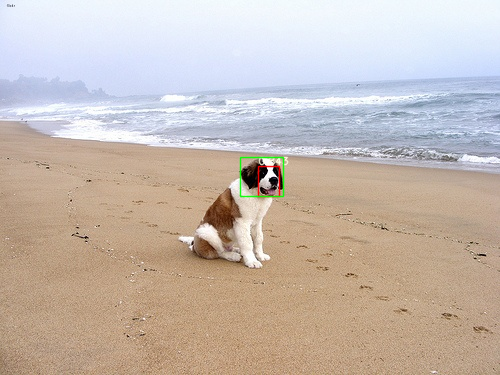

In [17]:
display(model, pets_paths[random.randint(0, len(pets_paths))], device, img_size, augment=2)

[[182.0, 80.0, 122.0, 87.0]]


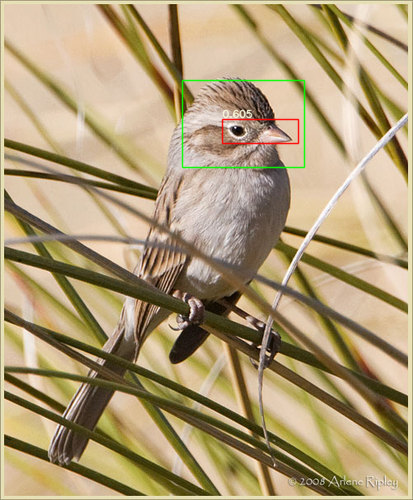

([[222, 119, 76, 24]],
 [[0.5714285969734192,
   0.26600000262260437,
   0.5811138153076172,
   0.25600001215934753,
   0.6924939751625061,
   0.26600000262260437,
   0.648910403251648,
   0.27399998903274536,
   0.6537530422210693,
   0.2680000066757202]],
 [array(    0.60516, dtype=float32)])

In [146]:
display(model, birds_paths[random.randint(0, len(birds_paths))], device, img_size)

[[49.0, 42.0, 158.0, 193.0]]


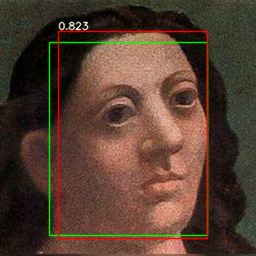

([[58, 31, 149, 207]],
 [[0.46484375,
   0.4375,
   0.71875,
   0.38671875,
   0.68359375,
   0.55859375,
   0.55859375,
   0.734375,
   0.734375,
   0.6953125]],
 [array(    0.82374, dtype=float32)])

In [156]:
display(model, art_paths[random.randint(0, len(art_paths))], device, img_size)

[[683.0, 401.0, 233.0, 254.0]]


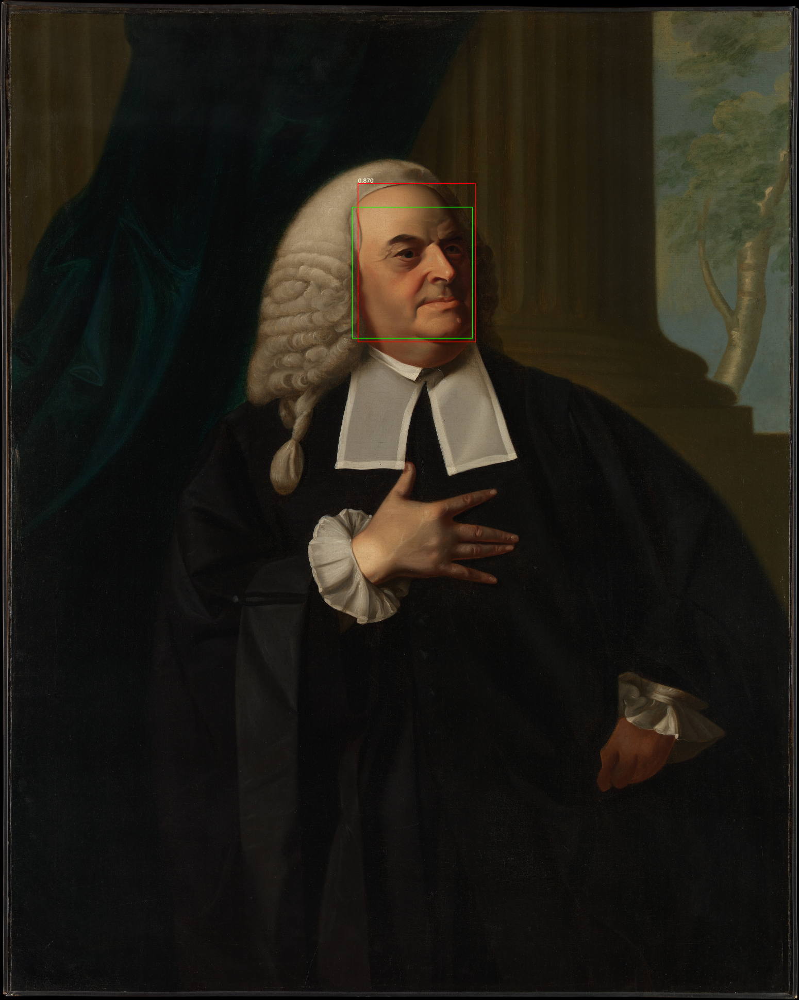

([[694, 355, 228, 307]],
 [[0.5090322494506836,
   0.2549019753932953,
   0.5664516091346741,
   0.24561403691768646,
   0.5619354844093323,
   0.27089783549308777,
   0.5258064270019531,
   0.30598554015159607,
   0.578064501285553,
   0.2982456088066101]],
 [array(    0.87057, dtype=float32)])

In [165]:
display(model, met_paths[random.randint(0, len(met_paths))], device, img_size)

[[695.0, 306.0, 498.0, 473.0]]


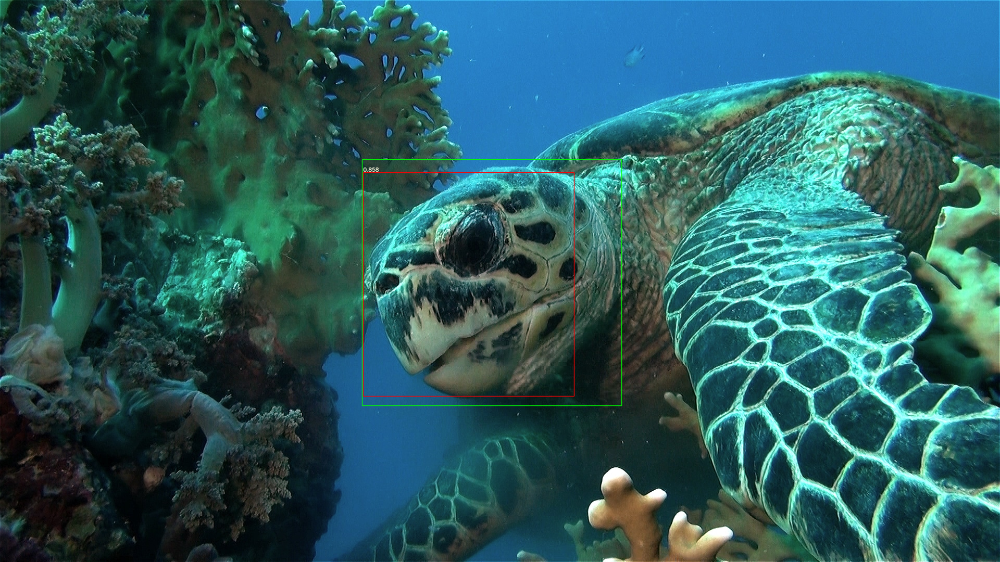

([[697, 331, 405, 430]],
 [[0.390625,
   0.5064814686775208,
   0.5067708492279053,
   0.3907407522201538,
   0.4151041805744171,
   0.49074074625968933,
   0.421875,
   0.6490740776062012,
   0.5520833134651184,
   0.5351851582527161]],
 [array(    0.85874, dtype=float32)])

In [182]:
display(model, turtles_paths[random.randint(0, len(turtles_paths))], device, img_size)

/workspace/dataset/animefaces/labels_eval/006388.txt
[]


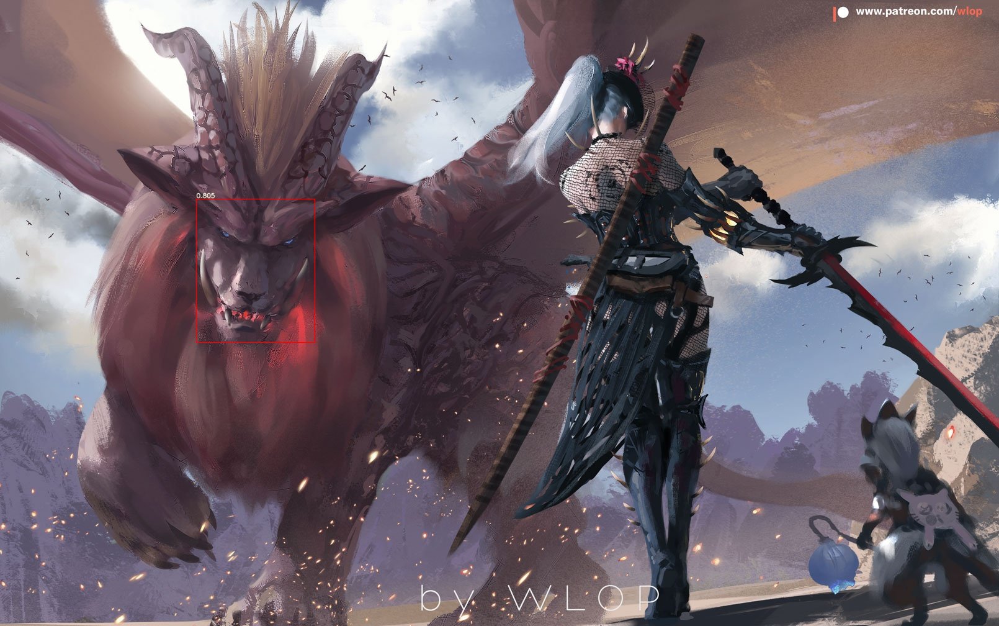

([[316, 320, 191, 231]],
 [[0.22360248863697052,
   0.3839285671710968,
   0.2857142984867096,
   0.391865074634552,
   0.2459627389907837,
   0.471230149269104,
   0.2254658341407776,
   0.488095223903656,
   0.2708074450492859,
   0.4930555522441864]],
 [array(    0.80511, dtype=float32)])

In [224]:
display(model, anime_paths[random.randint(0, len(anime_paths))], device, img_size)